## System 6: Visualization and Analysis

This system enables the visualization and analysis of 400Hz data outputted by System 5.

**Inputs:**

- `5c` (one or multiple CSVs): Operations with emissions metadata. Multiple CSVs will be merged together and de-duplicated such that no operation repeats.

**Output:**

- See annotated visualizations and analysis below.

In [1]:
#Installing prettytable
!pip install prettytable

In [2]:
# Dependencies

# For any missing libraries, just run (remove curly braces):
# !pip install {library_name}
 
## Required
import pandas as pd
import numpy as np
import seaborn as sns
from tqdm import tqdm_notebook as tqdm
import datetime as dt

import matplotlib
matplotlib.use('nbagg')
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from prettytable import PrettyTable
from scipy import stats

import random

In [3]:
# Input files in list form
# Each item in the array should be a string with a valid path to a CSV

input_5c_locations = [
    'sample_data/5c_all_operations_with_all_emissions_metadata.csv']
   # 'sample_data/5c_all_operations_with_all_emissions_metadata_more_data.csv', # Output from another run of the system, with more data
    

In [4]:
# Input files in list form
# Each item in the array should be a string with a valid path to a CSV

input_5c_locations = [
    'sample_data/5c_all_operations_with_all_emissions_metadata.csv']

# Setup and Basic Statistics of Dataset

In [5]:
# Bring in operations with emissions totlas from from System 5
date_like = ['Real_Timestamp', 'Actual Landing Time (Aerobahn)', 
             'Scheduled In Block Time (Aerobahn)',
             'Scheduled Off Block Time (Aerobahn)',
             'in_block_time_dt',
             'off_block_time_dt', 
             'Row_Time_Delta']

# Choose columns to group by to define an operation
# This will be used in de-duplication if multiple data sources have the same operation
de_dup_cols = ['Gate', 'Actual Landing Time (Aerobahn)', 'Registration', 'Real_Timestamp']

print("Attempting to import %d CSVs" % len(input_5c_locations))

dfs = []
for file_path in input_5c_locations:
    df = pd.read_csv(file_path, parse_dates=date_like, infer_datetime_format=True)
    op_count = df['op_id'].nunique()
    print("Bringing in %s with %d rows and %d operations" % (file_path, len(df), op_count))
    # Row time delta handling, conversion to NS
    df['Row_Time_Delta'] = pd.to_timedelta(df['Row_Time_Delta']) # Force Time Delta column type
    df['Source_CSV'] = file_path
    dfs.append(df)
    
concatenated_dfs = pd.concat(dfs, sort=False)
print("Concatenated data frame has %d rows before de-duplication" % len(concatenated_dfs))
predata = concatenated_dfs.drop_duplicates(subset=de_dup_cols, keep="first")

# Group rows that represent a single operation together, and define an op_id column
group_vars = ['Gate', 'Actual Landing Time (Aerobahn)', 'Registration'] # Choose columns to group by to define an operation
predata['op_id'] = predata.groupby(group_vars).ngroup() # Define a unique op id (unique in the space of this dataset)
predata.reset_index(drop=True, inplace=True)

# Setting up a dataframe that just contains the first values in each column for each operation
# Must only be used for columns that have the same value throughout each operation (i.e. aggregated cols, gate, etc.)

Attempting to import 1 CSVs
Bringing in sample_data/5c_all_operations_with_all_emissions_metadata.csv with 407704 rows and 22745 operations
Concatenated data frame has 407704 rows before de-duplication


In [6]:
#Remove operations above 3 hours to make a valid assumtion
data=predata[predata['block_time_delta']<800]
data180=predata[predata['block_time_delta']<180]
op_count = data['op_id'].nunique()

In [7]:
operations_grouped = data.groupby("op_id").first()
operations_grouped180 = data180.groupby("op_id").first()

print("De-duplicated data frame has %d rows and %d operations." % (len(predata), op_count))

De-duplicated data frame has 407704 rows and 22745 operations.


In [8]:
# List of all gates represented in data
print("Gates represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Gate'].value_counts())

Gates represented in this dataset, with corresponding number of rows (desc.)


Gate_F79     15706
Gate_F77B    15580
Gate_E68     15017
Gate_E69     14780
Gate_E65     14592
Gate_E60     14459
Gate_F71B    14088
Gate_E61     14031
Gate_E62     13922
Gate_E64     12831
Gate_F70     12515
Gate_F71A    12441
Gate_E67     12422
Gate_E66     11193
Gate_A1      10823
Gate_E63     10548
Gate_D54B     9861
Gate_D53      9149
Gate_D55      9120
Gate_G92      9081
Gate_D50A     8470
Gate_D52      8369
Gate_D56A     8131
Gate_D54A     7731
Gate_D51B     7619
Gate_A12      7526
Gate_D50B     7379
Gate_D58A     7272
Gate_D51A     7241
Gate_A10      6960
Gate_D56B     6956
Gate_G91      6902
Gate_G96      6811
Gate_G94      6790
Gate_D57      6613
Gate_G93      5232
Gate_G97      4709
Gate_G98      4296
Gate_G100     4273
Gate_G95      4099
Gate_D58B     3950
Gate_A7       3774
Gate_A2       2827
Gate_A9       2564
Gate_A4       2324
Gate_A6       1752
Gate_A8       1444
Gate_A5       1398
Gate_A3        994
Gate_D59       871
Gate_A11A      236
Gate_A1B        32
Name: Gate, 

In [9]:
# List of all gates represented in data
print("Aircraft Models represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Gate'].value_counts())

Aircraft Models represented in this dataset, with corresponding number of rows (desc.)


Gate_F79     15706
Gate_F77B    15580
Gate_E68     15017
Gate_E69     14780
Gate_E65     14592
Gate_E60     14459
Gate_F71B    14088
Gate_E61     14031
Gate_E62     13922
Gate_E64     12831
Gate_F70     12515
Gate_F71A    12441
Gate_E67     12422
Gate_E66     11193
Gate_A1      10823
Gate_E63     10548
Gate_D54B     9861
Gate_D53      9149
Gate_D55      9120
Gate_G92      9081
Gate_D50A     8470
Gate_D52      8369
Gate_D56A     8131
Gate_D54A     7731
Gate_D51B     7619
Gate_A12      7526
Gate_D50B     7379
Gate_D58A     7272
Gate_D51A     7241
Gate_A10      6960
Gate_D56B     6956
Gate_G91      6902
Gate_G96      6811
Gate_G94      6790
Gate_D57      6613
Gate_G93      5232
Gate_G97      4709
Gate_G98      4296
Gate_G100     4273
Gate_G95      4099
Gate_D58B     3950
Gate_A7       3774
Gate_A2       2827
Gate_A9       2564
Gate_A4       2324
Gate_A6       1752
Gate_A8       1444
Gate_A5       1398
Gate_A3        994
Gate_D59       871
Gate_A11A      236
Gate_A1B        32
Name: Gate, 

In [10]:
# Aircraft models represented in this dataset
print("Aircraft Models represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Full_Name '].value_counts())

Aircraft Models represented in this dataset, with corresponding number of rows (desc.)


Boeing 737-900      79064
Embraer 175         71844
Airbus A320         64265
Boeing 737-800      63828
Airbus A321         37181
Boeing 787-9        23735
Airbus A319         19347
Boeing 777-200       8142
CRJ-200              6896
Boeing 777-300ER     6576
Airbus A321neo       4722
Boeing 777-200ER     4005
CRJ-900              3667
Boeing 737-700       2635
Boeing 757-200       2243
Airbus A350-900      1998
Boeing 787-8         1587
CRJ-700              1543
Airbus A330-200      1528
Boeing 757-300        792
Boeing 767-300        532
Boeing 747-400        494
Airbus A320neo        385
Boeing 737-600        262
Airbus A380-800       189
Airbus A330-300       131
Airbus A340-300        41
MD-83                  37
Boeing 787-10          18
Boeing 777-200LR       17
Name: Full_Name , dtype: int64

In [11]:
data180.sort_values(by=['Category','Full_Name '],ascending=True)['Full_Name '].value_counts()

Boeing 737-900      69494
Embraer 175         67217
Airbus A320         58751
Boeing 737-800      55361
Airbus A321         28019
Airbus A319         18197
Boeing 787-9        14760
CRJ-200              6332
CRJ-900              3667
Airbus A321neo       3390
Boeing 777-200ER     3220
Boeing 737-700       2306
Airbus A350-900      1841
Boeing 777-300ER     1818
Boeing 777-200       1750
Boeing 787-8         1587
CRJ-700              1506
Boeing 757-200       1351
Boeing 767-300        532
Airbus A330-200       444
Boeing 757-300        416
Airbus A320neo        385
Boeing 737-600        262
Boeing 747-400        206
Airbus A380-800       151
Airbus A330-300       131
MD-83                  37
Boeing 787-10          18
Boeing 777-200LR       17
Name: Full_Name , dtype: int64

In [12]:
list(data180.sort_values(by=['Category','Full_Name '],ascending=True)['Full_Name '].unique())

['Airbus A380-800',
 'Airbus A319',
 'Airbus A320',
 'Airbus A320neo',
 'Airbus A321',
 'Airbus A321neo',
 'Boeing 737-600',
 'Boeing 737-700',
 'Boeing 737-800',
 'Boeing 737-900',
 'Boeing 757-200',
 'Boeing 757-300',
 'MD-83',
 'CRJ-200',
 'CRJ-700',
 'CRJ-900',
 'Embraer 175',
 'Airbus A330-200',
 'Airbus A330-300',
 'Airbus A350-900',
 'Boeing 747-400',
 'Boeing 767-300',
 'Boeing 777-200',
 'Boeing 777-200ER',
 'Boeing 777-200LR',
 'Boeing 777-300ER',
 'Boeing 787-10',
 'Boeing 787-8',
 'Boeing 787-9']

In [39]:
order_list = [
 
 'MD-83',
 'CRJ-200',
 'CRJ-700',
 'CRJ-900',
 'Embraer 175',
    
 'Airbus A319',
 'Airbus A320',
 'Airbus A320neo',
 'Airbus A321',
 'Airbus A321neo',
 'Boeing 737-600',
 'Boeing 737-700',
 'Boeing 737-800',
 'Boeing 737-900',
 'Boeing 757-200',
 'Boeing 757-300',
              
 'Airbus A330-200',
 'Airbus A330-300',
 'Airbus A350-900',
 'Boeing 747-400',
 'Boeing 767-300',
 'Boeing 777-200',
 'Boeing 777-200ER',
 'Boeing 777-200LR',
 'Boeing 777-300ER',
 'Boeing 787-8',
 'Boeing 787-9',   

 'Airbus A380-800']


In [14]:
# Airlines represented in this dataset
print("Airlines represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['Carrier Group'].value_counts())

Airlines represented in this dataset, with corresponding number of rows (desc.)


United Airlines      239270
Alaska Airlines       77015
American Airlines     31666
Air Canada            15132
Jet Blue              13395
Other                 11143
Delta Air Lines        9592
Frontier Airlines      4191
Signature              3870
Pacific Aviation       2430
Name: Carrier Group, dtype: int64

In [15]:
data[data['Gate']=='Gate_A1'].groupby('op_id').first()['total_time_400hz'].unique()

array([0.])

In [16]:
# Airplane Design Group (ADG)s represented in this dataset
print("Airplane Design Group (ADG) represented in this dataset, with corresponding number of rows (desc.)")
with pd.option_context("display.max_rows", 100):
    display(data['ADG'].value_counts())

Airplane Design Group (ADG) represented in this dataset, with corresponding number of rows (desc.)


III    341232
V       48272
IV       9572
II       8439
VI        189
Name: ADG, dtype: int64

In [17]:
#Add worst case conditions
operations_grouped180['worst_apu_NOx (kg)']=operations_grouped180['Normal NOx (kg/hr)']*operations_grouped180['block_time_delta']/60
operations_grouped180['worst_apu_NO2 (kg)']=operations_grouped180['Normal NO2 (kg/hr)']*operations_grouped180['block_time_delta']/60
operations_grouped180['worst_apu_CO (kg)']=operations_grouped180['Normal CO (kg/hr)']*operations_grouped180['block_time_delta']/60
operations_grouped180['worst_apu_HC (kg)']=operations_grouped180['Normal HC (kg/hr)']*operations_grouped180['block_time_delta']/60
operations_grouped180['worst_apu_PM (kg)']=operations_grouped180['Normal PM (kg/hr)']*operations_grouped180['block_time_delta']/60
operations_grouped180['worst_apu_Fuel (kg)']=operations_grouped180['Normal Fuel (kg/hr)']*operations_grouped180['block_time_delta']/60

operations_grouped180['worst_apu_ACRP_Fuel (kg)']=operations_grouped180['ACRP_ECS_d_FF(kg/s)']*operations_grouped180['block_time_delta']*60
operations_grouped180['worst_apu_ACRP_EICO2(kg)']=operations_grouped180['ACRP_ECS_EICO2(g/kgfuel)']*operations_grouped180['block_time_delta']*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*60/1000
operations_grouped180['worst_apu_ACRP_EICO(kg)']=operations_grouped180['ACRP_ECS_EICO(g/kgfuel)']*operations_grouped180['block_time_delta']*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*60/1000
operations_grouped180['worst_apu_ACRP_EIHC(kg)']=operations_grouped180['ACRP_ECS_EIHC(g/kgfuel)']*operations_grouped180['block_time_delta']*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*60/1000
operations_grouped180['worst_apu_ACRP_EINOx(kg)']=operations_grouped180['ACRP_ECS_EINOx(g/kgfuel)']*operations_grouped180['block_time_delta']*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*60/1000

In [18]:
operations_grouped180['worst_apu_ACRP_EICO2(kg)'].sum()

9582202.6341

In [19]:
len(operations_grouped180['worst_apu_ACRP_EICO2(kg)'])

21486

In [20]:
operations_grouped180['Category'].unique()

array(['Narrow Body', 'Wide Body', 'Jumbo-Wide Body', 'Regional Jets'],
      dtype=object)

In [21]:
sum(operations_grouped180['Category']=='Regional Jets')

6017

In [22]:
sum(operations_grouped180['ACRP_ECS_d_FF(kg/s)'].isnull())

0

In [23]:
#Add best case conditions
operations_grouped180['best_apu_NOx_policy (kg)']=((12.0)*operations_grouped180['Normal NOx (kg/hr)']+ 3.0*operations_grouped180['Start NOx (kg/hr)'])/60
operations_grouped180['best_apu_NO2_policy (kg)']=((12.0)*operations_grouped180['Normal NO2 (kg/hr)']+ 3.0*operations_grouped180['Start NO2 (kg/hr)'])/60
operations_grouped180['best_apu_CO_policy (kg)']=((12.0)*operations_grouped180['Normal CO (kg/hr)']+ 3.0*operations_grouped180['Start CO (kg/hr)'])/60
operations_grouped180['best_apu_HC_policy (kg)']=((12.0)*operations_grouped180['Normal HC (kg/hr)']+ 3.0*operations_grouped180['Start HC (kg/hr)'])/60
operations_grouped180['best_apu_PM_policy (kg)']=((12.0)*operations_grouped180['Normal PM (kg/hr)']+ 3.0*operations_grouped180['Start PM (kg/hr)'])/60
operations_grouped180['best_apu_Fuel_policy (kg)']=((12.0)*operations_grouped180['Normal Fuel (kg/hr)']+ 3.0*operations_grouped180['Start Fuel (kg/hr)'])/60

operations_grouped180['best_apu_NOx (kg)']=operations_grouped180[['best_apu_NOx_policy (kg)','NOx (kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_NO2 (kg)']=operations_grouped180[['best_apu_NO2_policy (kg)','NO2 (kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_CO (kg)']=operations_grouped180[['best_apu_CO_policy (kg)','CO (kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_HC (kg)']=operations_grouped180[['best_apu_HC_policy (kg)','HC (kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_PM (kg)']=operations_grouped180[['best_apu_PM_policy (kg)','PM (kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_Fuel (kg)']=operations_grouped180[['best_apu_Fuel_policy (kg)','Fuel (kg)_grandtotal']].min(axis=1) 

operations_grouped180['best_apu_ACRP_Fuel_policy (kg)']=((12.0)*60.0*operations_grouped180['ACRP_ECS_d_FF(kg/s)']+ 3.0*60.0*operations_grouped180['ACRP_NoLoad_d_FF(kg/s)'])
operations_grouped180['best_apu_ACRP_EICO2_policy (kg)']=((12.0)*60.0*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*operations_grouped180['ACRP_ECS_EICO2(g/kgfuel)']/1000+ 3.0*60.0/1000*operations_grouped180['ACRP_NoLoad_EICO2(g/kgfuel)']*operations_grouped180['ACRP_NoLoad_d_FF(kg/s)'])
operations_grouped180['best_apu_ACRP_EICO_policy (kg)']=((12.0)*60.0*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*operations_grouped180['ACRP_ECS_EICO(g/kgfuel)']/1000+ 3.0*60.0/1000*operations_grouped180['ACRP_NoLoad_EICO2(g/kgfuel)']*operations_grouped180['ACRP_NoLoad_d_FF(kg/s)'])
operations_grouped180['best_apu_ACRP_EIHC_policy (kg)']=((12.0)*60.0*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*operations_grouped180['ACRP_ECS_EIHC(g/kgfuel)']/1000+ 3.0*60.0/1000*operations_grouped180['ACRP_NoLoad_EIHC(g/kgfuel)']*operations_grouped180['ACRP_NoLoad_d_FF(kg/s)'])
operations_grouped180['best_apu_ACRP_EINOx_policy (kg)']=((12.0)*60.0*operations_grouped180['ACRP_ECS_d_FF(kg/s)']*operations_grouped180['ACRP_ECS_EINOx(g/kgfuel)']/1000+ 3.0*60.0/1000*operations_grouped180['ACRP_NoLoad_EINOx(g/kgfuel)']*operations_grouped180['ACRP_NoLoad_d_FF(kg/s)'])   

operations_grouped180['best_apu_ACRP_Fuel (kg)']=operations_grouped180[['best_apu_ACRP_Fuel_policy (kg)','ACRP_d_FF(kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_ACRP_EICO2 (kg)']=operations_grouped180[['best_apu_ACRP_EICO2_policy (kg)','ACRP_EICO2(kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_ACRP_EICO (kg)']=operations_grouped180[['best_apu_ACRP_EICO_policy (kg)','ACRP_EICO(kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_ACRP_EIHC (kg)']=operations_grouped180[['best_apu_ACRP_EIHC_policy (kg)','ACRP_EIHC(kg)_grandtotal']].min(axis=1)
operations_grouped180['best_apu_ACRP_EINOx (kg)']=operations_grouped180[['best_apu_ACRP_EINOx_policy (kg)','ACRP_EINOx(kg)_grandtotal']].min(axis=1)


In [24]:
list(data.columns)

['Actual Landing Time (Aerobahn)',
 'Carrier Group',
 'Cumulative_kWh',
 'Destination Airport',
 'Gate',
 'International or Domestic Indicator',
 'Model',
 'Origination Airport',
 'Power_kW',
 'Real_Timestamp',
 'Registration',
 'Row_Time_Delta',
 'Scheduled In Block Time (Aerobahn)',
 'Scheduled Off Block Time (Aerobahn)',
 'block_time_delta',
 'call_sign_arrival',
 'call_sign_departure',
 'in_block_time_dt',
 'off_block_time_dt',
 'plane_in_ratio',
 'total_taxi_time_from_arrival',
 'total_taxi_time_from_departure',
 'op_id',
 'Row_Time_Delta_ns',
 'granularity_valid',
 'only_5m',
 'threshold',
 'threshold7',
 '>threshold',
 '>threshold7',
 'confidently_>threshold',
 'prediction',
 'time_after_arrival',
 'time_before_departure',
 'Neutal Net Predictions',
 'power_over_pred',
 'switch',
 'ratio_400hz',
 'ratio_APU',
 'time_400hz',
 'time_APU',
 'num_switches',
 'total_400hz_time',
 'total_APU_time',
 'total_time_400hz',
 'total_time_APU',
 'op_total_real',
 'op_total_400hz',
 'op_total

In [25]:
operations_grouped180['ratio_successful']=operations_grouped180['total_time_400hz']/operations_grouped180['block_time_delta']

In [26]:
data['ratio_successful']=data['total_time_400hz']/data['block_time_delta']

In [27]:
operations_grouped = data.groupby("op_id").first()
operations_grouped180 = data180.groupby("op_id").first()
print(len(operations_grouped))
print(len(operations_grouped180))

22745
21486


# Single Operation Visualization

In [ ]:
# Here we define our function that lets the user plot an operation by a given ID, with a ton of metadata
#
# Feel free to scroll right past this, but notice there are toggles that let you control which Y-Axis vectors are
# shown. This can produce cleaner graphs if you just wanted to, for example, look at only real, not predicted, values.
def plot_by_op_id(data, 
                  op_id, 
                  show_power=True,
                  show_plane_in_ratio=True,
                  show_threshold=True,
                  show_predicted=True,
                  show_ratio_400hz=True,
                  show_ratio_APU=True):
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    one_slice = data[data['op_id'] == op_id]
    
    total_real = 0
    total_400hz = 0
    total_APU = 0
    
    for item, row in one_slice.iterrows():
        row_time_in_hours = (int(row['Row_Time_Delta_ns']) / 60000000000) / 60
        total_real += row['Power_kW'] * row_time_in_hours
        total_400hz += row['prediction'] * row['ratio_400hz'] * row_time_in_hours
        total_APU += row['prediction'] * row['ratio_APU'] * row_time_in_hours
    
    total_pred = total_400hz + total_APU
    total_pred_ratio = 0
    if (total_real != 0):
        total_pred_ratio = (total_real - total_400hz) / total_real
        
    X = one_slice['Real_Timestamp']
    Y1 = one_slice['Power_kW']
    Y2 = one_slice['plane_in_ratio']
    Y3 = one_slice['ratio_400hz']
    Y4 = one_slice['ratio_APU']
    Y5 = one_slice['threshold']
    Y6 = one_slice['prediction']
    
    colors = px.colors.DEFAULT_PLOTLY_COLORS
    
    if show_power:
        fig.add_trace(
             go.Scatter(x=X, y=Y1, name="Power (kW)", line=dict(width=3, color='blue')), # fill='tozeroy',
            secondary_y=False,
        ) 
    
    if show_plane_in_ratio:    
        fig.add_trace(
            go.Scatter(x=X, y=Y2, name=u'Ratio Gate', line=dict(width=3, dash='dot', color='purple')),
            secondary_y=True,
        )

    if show_threshold:
        fig.add_trace(
            go.Scatter(x=X, y=Y5, name="Threshold", line=dict(width=4, color="green")), #, dash='dot')),
            secondary_y=False,
        )        
    
    if show_predicted:        
        fig.add_trace(
            go.Scatter(x=X, y=Y6, name="Neural Net Predicted Power", line=dict(width=3, color='red')),
            secondary_y=False,
        )        
    
    if show_ratio_400hz:
        fig.add_trace(
            go.Scatter(x=X, y=Y3, name="Ratio GP", line=dict(width=4, dash='dot', color='orange')),
            secondary_y=True,
        )
    
    if show_ratio_APU:
        fig.add_trace(
            go.Scatter(x=X, y=Y4, name="Ratio APU", line=dict(width=4, dash='dot', color='light blue')),
            secondary_y=True,
        )    
      
    fig.update_layout(
        legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=0.85),
        plot_bgcolor='rgba(0,0,0,0)',
        #title_text="Op ID %s: Carrier: %s, Registration: %s, Subtype: %s at %s" % (op_id, one_slice['Carrier Group'].iloc[0], one_slice['Registration'].iloc[0], one_slice['Model'].iloc[0], one_slice['Gate'].iloc[0])
    )
    
    if show_threshold:
        fig.update_yaxes(title_text="Power (kW), Threshold (kW)", secondary_y=False)
    else:
        fig.update_yaxes(title_text="Power (kW)", secondary_y=False)
    
    if show_ratio_400hz and show_ratio_APU:  
        fig.update_yaxes(title_text="Ratio Gate, Ratio GP, Ratio APU", secondary_y=True)
    else:
        fig.update_yaxes(title_text="Plane in Gate Ratio", secondary_y=True)
    fig.show()
    print("Time <br><br> <b>Total GPC Time</b>: %.2f mins, <b>Total APU Time</b>: %.2f mins" % (one_slice['total_time_400hz'].iloc[0], one_slice['total_time_APU'].iloc[0]))
    print("Op ID %s: Carrier: %s, Registration: %s, Subtype: %s at %s" % (op_id, one_slice['Carrier Group'].iloc[0], one_slice['Registration'].iloc[0], one_slice['Model'].iloc[0], one_slice['Gate'].iloc[0]))
    
    t = PrettyTable(['Power Prediction Data', 'Value'])
    t.add_row(['Total Real Energy (KWh)', '%s' % float('%.4g' % total_real)])
    t.add_row(['Total GP Energy Predicted (kWh)', '%s' % float('%.4g' % total_400hz)])
    t.add_row(['Total APU Energy Predicted (kWh)', '%s'% float('%.4g' % total_APU)])
    t.add_row(['Grand Total Energy Predicted (kWh)', '%s' % float('%.4g' % total_pred)])
    t.add_row(['400Hz Prediction Percentage Diff (0 is ideal)', '%s' % float('%.4g' % total_pred_ratio)])

    print(t)
    
    first_row = one_slice.iloc[0]
    t = PrettyTable(['Emission Type', 'APU Start Total (kg)', 'APU Normal Total (kg)', 'APU Grand Total (kg)'])
    cats = ['NOx', 'NO2', 'CO', 'HC', 'PM', 'Fuel']
    for cat in cats:
        normal_total_col = "Normal " + cat + " (kg)_total"
        start_total_col = "Start " + cat + " (kg)_total"
        grand_total_col = cat + " (kg)_grandtotal"
        normal_total = '%s' % float('%.2g' % first_row[normal_total_col])
        start_total = '%s' % float('%.2g' % first_row[start_total_col])
        grand_total = '%s' % float('%.2g' % first_row[grand_total_col])
        t.add_row([cat, start_total, normal_total, grand_total])
    print(t)
    
    t = PrettyTable(['Emission Type', 'APU No Load Total (kg)', 'APU ECS Total (kg)', 'APU Grand Total (kg)'])
    #cats = ['NOx', 'NO2', 'CO', 'HC', 'PM', 'Fuel']
   
    t.add_row(['ACRP Fuel (kg)', first_row['ACRP_NoLoad_d_FF(kg)'], first_row['ACRP_ECS_d_FF(kg)_total'], first_row['ACRP_d_FF(kg)_grandtotal']])
    t.add_row(['ACRP EICO2 (kg)', first_row['ACRP_NoLoad_EICO2(kg)'], first_row['ACRP_ECS_EICO2(kg)_total'], first_row['ACRP_EICO2(kg)_grandtotal']])
    t.add_row(['ACRP EICO (kg)', first_row['ACRP_NoLoad_EICO(kg)'], first_row['ACRP_ECS_EICO(kg)_total'], first_row['ACRP_EICO(kg)_grandtotal']])                                                                         
    t.add_row(['ACRP EIHC (kg)', first_row['ACRP_NoLoad_EIHC(kg)'], first_row['ACRP_ECS_EIHC(kg)_total'], first_row['ACRP_EIHC(kg)_grandtotal']])
    t.add_row(['ACRP EINOx (kg)', first_row['ACRP_NoLoad_EINOx(kg)'], first_row['ACRP_ECS_EINOx(kg)_total'], first_row['ACRP_EINOx(kg)_grandtotal']])
    print(t)
    
    t = PrettyTable(['Emission Type', 'Worst case (kg)', 'APU Grand Total (kg)', 'Best case (kg)'])
    #cats = ['NOx', 'NO2', 'CO', 'HC', 'PM', 'Fuel']
   
    t.add_row(['NOx' , first_row['worst_apu_NOx (kg)'], first_row['NOx (kg)_grandtotal'], first_row['best_apu_NOx (kg)']])
    t.add_row(['NO2' , first_row['worst_apu_NO2 (kg)'], first_row['NO2 (kg)_grandtotal'], first_row['best_apu_NO2 (kg)']])
    t.add_row(['CO' , first_row['worst_apu_CO (kg)'], first_row['CO (kg)_grandtotal'], first_row['best_apu_CO (kg)']])    
    t.add_row(['HC' , first_row['worst_apu_HC (kg)'], first_row['HC (kg)_grandtotal'], first_row['best_apu_HC (kg)']])
    t.add_row(['PM' , first_row['worst_apu_PM (kg)'], first_row['PM (kg)_grandtotal'], first_row['best_apu_PM (kg)']])
    t.add_row(['Fuel' , first_row['worst_apu_Fuel (kg)'], first_row['Fuel (kg)_grandtotal'], first_row['best_apu_Fuel (kg)']])
    
    t.add_row(['ACRP_Fuel' , first_row['worst_apu_ACRP_Fuel (kg)'], first_row['ACRP_d_FF(kg)_grandtotal'], first_row['best_apu_ACRP_Fuel (kg)']])
    t.add_row(['ACRP EICO2 (kg)' , first_row['worst_apu_ACRP_EICO2(kg)'], first_row['ACRP_EICO2(kg)_grandtotal'], first_row['best_apu_ACRP_EICO2 (kg)']])
    t.add_row(['ACRP EICO (kg)' , first_row['worst_apu_ACRP_EICO(kg)'], first_row['ACRP_EICO(kg)_grandtotal'], first_row['best_apu_ACRP_EICO (kg)']])
    t.add_row(['ACRP EIHC (kg)' , first_row['worst_apu_ACRP_EIHC(kg)'], first_row['ACRP_EIHC(kg)_grandtotal'], first_row['best_apu_ACRP_EIHC (kg)']])
    t.add_row(['ACRP EINOx (kg)' , first_row['worst_apu_ACRP_EINOx(kg)'], first_row['ACRP_EINOx(kg)_grandtotal'], first_row['best_apu_ACRP_EINOx (kg)']])
    print(t)

In [ ]:
testdata = data[data['Carrier Group'] == 'Delta Air Lines'] 
testdata['ratio_successful'].unique()


In [ ]:
# Single Operation Visualization Tool, with Consumption, Predicted APU Values, and Emissions Metadata

#plot_by_op_id(data, random.randint(0, op_count))
plot_by_op_id(data180,random.randint(0, op_count)) 


# To plot multiple operations at once, change the variable below to a number of your choice
num_ops_to_plot = 2
for i in np.random.randint(op_count, size=num_ops_to_plot):
    display(plot_by_op_id(data180, 10532))

# Consumption Patterns by Gate & Aircraft Type

In [ ]:

data_with_gate_in = data180[data180['>threshold7'] == True]
mean_power_per_pax=data_with_gate_in.groupby('Passenger_Capacity').mean()['Power_kW']
values = np.vstack([data_with_gate_in['Passenger_Capacity'],data_with_gate_in['Power_kW']])
kernel = stats.gaussian_kde(values)(values)

In [ ]:
mean_power_per_pax=data_with_gate_in.groupby('Passenger_Capacity').mean()['Power_kW']
#mean_power_per_pax_fix=mean_power_per_pax['Power_kW']
mean_power_per_pax_fix[290]=45
mean_power_per_pax_fix[230]=40
mean_power_per_pax_fix[215]=40
mean_power_per_pax_fix[178]=35
mean_power_per_pax

In [ ]:
def func(x,p1,p2,p3,p4):
    return  p1*np.log(p4*x-p3)+p2

x = np.array(mean_power_per_pax.index.values.tolist(), dtype=float) #transform your data in a numpy array of floats 
y = np.array(list(mean_power_per_pax), dtype=float) #so the curve_fit can work

from scipy.optimize import curve_fit
popt, pcov = curve_fit(func, x,y,p0=(19,0,20,0.5),maxfev=2000)
p1 = popt[0]
p2 = popt[1]
p3 = popt[2]
p4 = popt[3]
print (['p1*log(p4*x-p3)+p2',p1,p2,p3,p4])
curvex=x
curvey=func(curvex,p1,p2,p3,p4)

In [ ]:
fig, ax=plt.subplots(figsize=(12,10))
p=sns.scatterplot(data_with_gate_in['Passenger_Capacity'],data_with_gate_in['Power_kW'],c=kernel,cmap="viridis",ax=ax)
p.plot(mean_power_per_pax,color='r',lw=3)
p.plot(curvex,curvey, lw=3)

plt.tick_params(labelsize=14)
plt.ylim(0, 120)
plt.ylabel('Power (kW)',fontsize=16)
plt.xlabel('Passenger Capacity',fontsize=16)
plt.legend(labels=['Operation Data (Color Dependent on Density)', 'Average GP per Passenger Capacity', 'Regression y=28*log(0.105*x+4.82)-59.79'],loc='upper center',framealpha=1,fontsize=25)
plt.setp(p.get_legend().get_texts(), fontsize='14')

In [40]:
data_with_gate_in_180['Full_Name '].value_counts()

Boeing 737-900      41273
Airbus A320         32954
Boeing 737-800      27157
Embraer 175         19495
Airbus A319         10410
Airbus A321          7834
Boeing 787-9         4335
Boeing 777-200ER     1504
Airbus A321neo       1355
Boeing 777-300ER     1188
Airbus A350-900       879
Boeing 777-200        844
Boeing 757-200        682
Boeing 737-700        595
CRJ-200               540
Boeing 787-8          430
Boeing 767-300        276
Boeing 757-300        260
CRJ-700               218
CRJ-900               169
Boeing 747-400        100
Airbus A380-800        39
Airbus A320neo         29
Airbus A330-300        24
Boeing 737-600         19
MD-83                   9
Boeing 777-200LR        8
Airbus A330-200         5
Name: Full_Name , dtype: int64

In [41]:
order_list

['MD-83',
 'CRJ-200',
 'CRJ-700',
 'CRJ-900',
 'Embraer 175',
 'Airbus A319',
 'Airbus A320',
 'Airbus A320neo',
 'Airbus A321',
 'Airbus A321neo',
 'Boeing 737-600',
 'Boeing 737-700',
 'Boeing 737-800',
 'Boeing 737-900',
 'Boeing 757-200',
 'Boeing 757-300',
 'Airbus A330-200',
 'Airbus A330-300',
 'Airbus A350-900',
 'Boeing 747-400',
 'Boeing 767-300',
 'Boeing 777-200',
 'Boeing 777-200ER',
 'Boeing 777-200LR',
 'Boeing 777-300ER',
 'Boeing 787-8',
 'Boeing 787-9',
 'Airbus A380-800']

C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



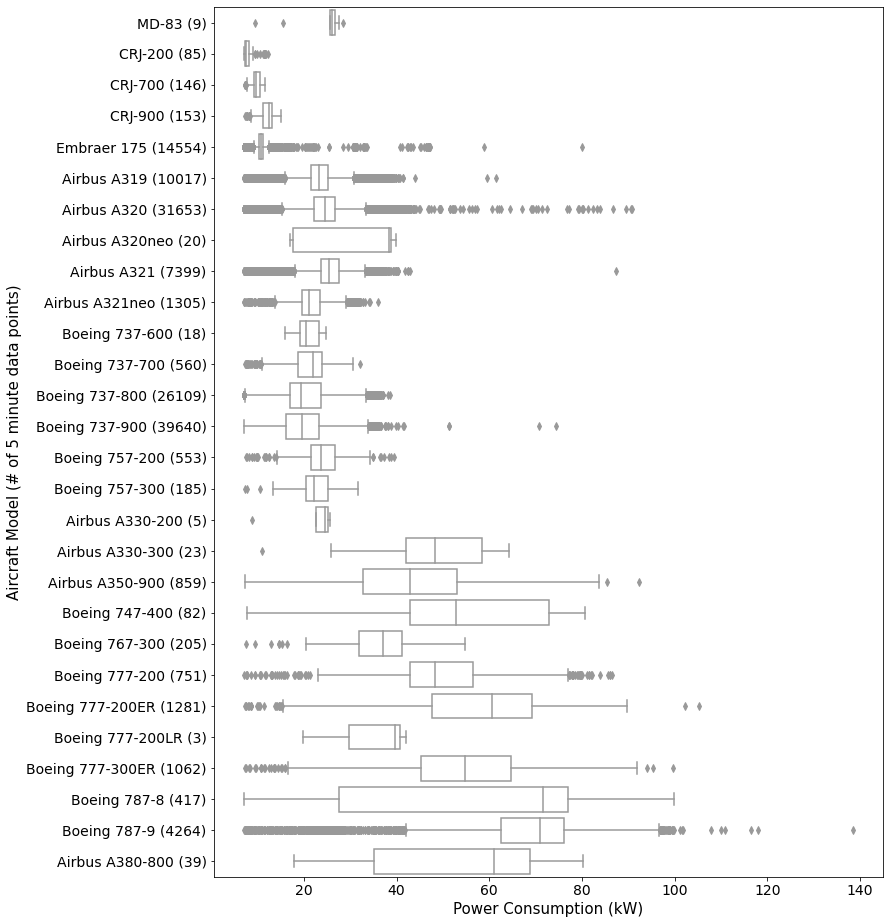

In [119]:
# Box whisker of consumption by aircraft subtypes
data_with_gate_in_180 = data180[data180['>threshold7'] == True]
data_with_gate_in = data[data['>threshold7'] == True]


counts = data_with_gate_in_180['Full_Name '].value_counts()

tick_names = []
for i in range(len(order_list)):
    s = order_list[i] + " (" + str(counts[order_list[i]]) + ")"
    tick_names.append(s)

plt.figure(figsize=(12,16))
p=sns.boxplot(data_with_gate_in_180['Power_kW'], data_with_gate_in_180['Full_Name '], color='white', order=order_list);
plt.tick_params(labelsize=14)

p.set_yticklabels(tick_names);

plt.xlabel('Power Consumption (kW)',fontsize=15)
plt.ylabel('Aircraft Model (# of 5 minute data points)',fontsize=15)
#plt.title('GPC Consumption Data by Aircraft Subtype (for all plugged-in time periods)',fontsize=20);
plt.rcParams["axes.labelweight"] = "normal"
#plt.ylim(0, 130)

In [49]:
filterval=['Full_Name ']
valueval=['Power_kW']
boxdf=pd.DataFrame()
boxdf['0%']=data_with_gate_in_180.groupby(filterval)[valueval].min()
boxdf['5%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.05)
boxdf['25%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.25)
boxdf['50%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.5)
boxdf['75%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.75)
boxdf['95%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.95)
boxdf['100%']=data_with_gate_in_180.groupby(filterval)[valueval].max()
boxdf['mean']=data_with_gate_in_180.groupby(filterval)[valueval].mean()
boxdf['STD']=data_with_gate_in_180.groupby(filterval)[valueval].std()
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per model')





In [ ]:
subtypes = data['Model'].unique()
subtypes.sort()
for subtype in subtypes:
    plt.figure()
    sns.distplot(data[(data['Model'] == subtype) & (data['plane_in_ratio'] == 1) & (data['Power_kW'] >= 2)]['Power_kW'], color='blue',kde=False, bins=30, norm_hist=True, hist=True)
    plt.title('Histogram of Power Consumption for %s for all plugged-in time periods' % subtype)
    plt.xlabel('Power (kW)')
    plt.ylabel('Probability')

In [140]:
# APU Time by Airline
data180=data[data['block_time_delta']<181]
subtypes = data180['Model'].unique()
plt.figure(figsize=(4,5)) 
for subtype in subtypes:
    #if num_rows[subtype] < 1000:
   #     continue
        
    this_subtype = data180[(data180['Model']==subtype) & (data180['plane_in_ratio']==1.0)]
   # avg = np.mean(this_subtype['total_time_APU'])
   
    fig =  px.histogram(this_subtype, x="Power_kW", histnorm='probability') #, color='ADG')
    fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)')

# Set axes title
#fig.update_xaxes(title_text="Ratio of Operation Success <br><br><b>Average Success Ratio: %.2f</b>" % avg)
    fig.update_yaxes(title_text="Probability")
    fig.update_xaxes(title_text='Power measured with aircraft at gate (kW)')
    print(subtype)
    # Add figure title
    #fig.update_layout(
    #    title={
    #    'text': "Airline: <b>%s</b> <br> Distribution of Total APU Time Per Operation" % (carrier),
    #    'x':0.5,
    #    'xanchor': 'center', 
    #    } 
    # )

    # Set axes title
   # fig.update_xaxes(title_text="Total APU Time per Operation <br><br><b>Average Time: %.2fm</b>" % avg)
    #fig.update_yaxes(title_text="Probability")

    fig.show()

B738


B737


B736


A321


B789


A320


A332


A319


A21N


A20N


A359


B77W


A388


B772


B744


A333


E75


B739


E75L


319


328


73R


739


320


3SE


73H


B763


B752


MD83


B788


37K


20S


73Q


73Y


19S


19C


20C


19F


73C


75B


75E


75K


77M


77G


78V


19G


CR7


CRJ


78Z


77X


77W


77N


CRJ9


77U


77Y


77Q


B77L


78J


77E


<Figure size 288x360 with 0 Axes>

C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


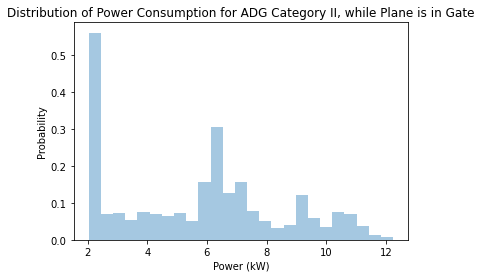

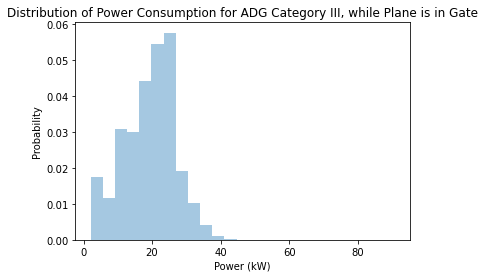

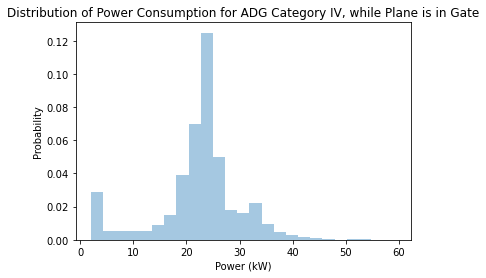

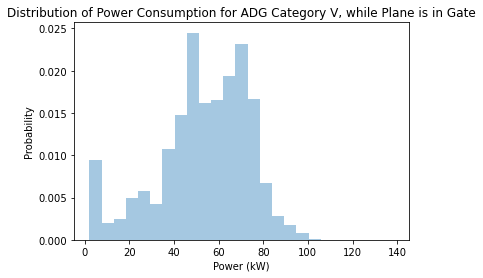

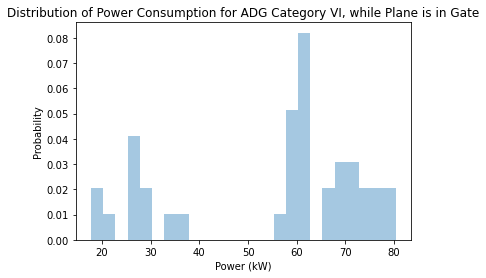

In [51]:
# Consumption distributions per Airplane Design Group

design_categories = data['ADG'].unique()
design_categories.sort()
for _, category in enumerate(design_categories):
    ax = sns.distplot(data.loc[(data['ADG'] == category) & (data['plane_in_ratio'] == 1.0) & (data['Power_kW'] >= 2), 'Power_kW'], kde=False, norm_hist=True, bins = 25)
    ax.set(xlabel='Power (kW)', ylabel='Probability', title='Distribution of Power Consumption for ADG Category %s, while Plane is in Gate' % (category)) 
    plt.show()

In [57]:

gate_airlines=data_with_gate_in_180.groupby(['Gate','Carrier Group']).apply(lambda x: x.name)
ff=pd.DataFrame(list(gate_airlines.keys()),columns=['Gate','Carrier Group'])
cc=ff.groupby(['Gate']).count()#.reset_index()
dd=pd.DataFrame(cc['Carrier Group']).rename(columns={'Carrier Group': 'n_airlines_at_gate'})
for i in range(len(dd)):
    if dd['n_airlines_at_gate'][i]!=1:
        dd['n_airlines_at_gate'][i]=9
ee = ff.join(other=dd, on='Gate', how='left').sort_values(by=['n_airlines_at_gate','Carrier Group','Gate']).reset_index()
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(ee)
sorted_gates=ee['Gate'].unique()

    

    index       Gate      Carrier Group  n_airlines_at_gate
0      36  Gate_D50A    Alaska Airlines                   1
1      37  Gate_D50B    Alaska Airlines                   1
2      38  Gate_D51A    Alaska Airlines                   1
3      39  Gate_D51B    Alaska Airlines                   1
4      40   Gate_D52    Alaska Airlines                   1
5      41   Gate_D53    Alaska Airlines                   1
6      42  Gate_D54A    Alaska Airlines                   1
7      43  Gate_D54B    Alaska Airlines                   1
8      52   Gate_D59    Alaska Airlines                   1
9      46  Gate_D56A  American Airlines                   1
10     47  Gate_D56B  American Airlines                   1
11     48   Gate_D57  American Airlines                   1
12     49  Gate_D58A  American Airlines                   1
13      2   Gate_A1B          Signature                   1
14     53   Gate_E60    United Airlines                   1
15     54   Gate_E61    United Airlines 

In [58]:
sorted_gates

array(['Gate_D50A', 'Gate_D50B', 'Gate_D51A', 'Gate_D51B', 'Gate_D52',
       'Gate_D53', 'Gate_D54A', 'Gate_D54B', 'Gate_D59', 'Gate_D56A',
       'Gate_D56B', 'Gate_D57', 'Gate_D58A', 'Gate_A1B', 'Gate_E60',
       'Gate_E61', 'Gate_E62', 'Gate_E63', 'Gate_E64', 'Gate_E66',
       'Gate_E67', 'Gate_E68', 'Gate_E69', 'Gate_F70', 'Gate_F71A',
       'Gate_F71B', 'Gate_F77B', 'Gate_F79', 'Gate_G100', 'Gate_G91',
       'Gate_G92', 'Gate_G93', 'Gate_G94', 'Gate_G95', 'Gate_G96',
       'Gate_G97', 'Gate_G98', 'Gate_D55', 'Gate_D58B', 'Gate_A4',
       'Gate_A11A', 'Gate_A2', 'Gate_A3', 'Gate_A5', 'Gate_A6', 'Gate_A7',
       'Gate_A8', 'Gate_A9'], dtype=object)

In [68]:
sorted_gates=['Gate_D50A', 'Gate_D50B', 'Gate_D51A', 'Gate_D51B', 'Gate_D52',
       'Gate_D53', 'Gate_D54A', 'Gate_D54B', 'Gate_D59', 'Gate_D56A',
       'Gate_D56B', 'Gate_D57', 'Gate_D58A', 'Gate_A1B', 'Gate_E60',
       'Gate_E61', 'Gate_E62', 'Gate_E63', 'Gate_E64', 'Gate_E66',
       'Gate_E67', 'Gate_E68', 'Gate_E69', 'Gate_F70', 'Gate_F71A',
       'Gate_F71B', 'Gate_F77B', 'Gate_F79', 'Gate_A4',
       'Gate_A2', 'Gate_A3', 'Gate_A5', 'Gate_A6', 'Gate_A7',
       'Gate_A8', 'Gate_A9','Gate_A11A', 'Gate_D55', 'Gate_D58B','Gate_G91',
       'Gate_G92', 'Gate_G93', 'Gate_G94', 'Gate_G95', 'Gate_G96',
       'Gate_G97', 'Gate_G98', 'Gate_G100']

C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



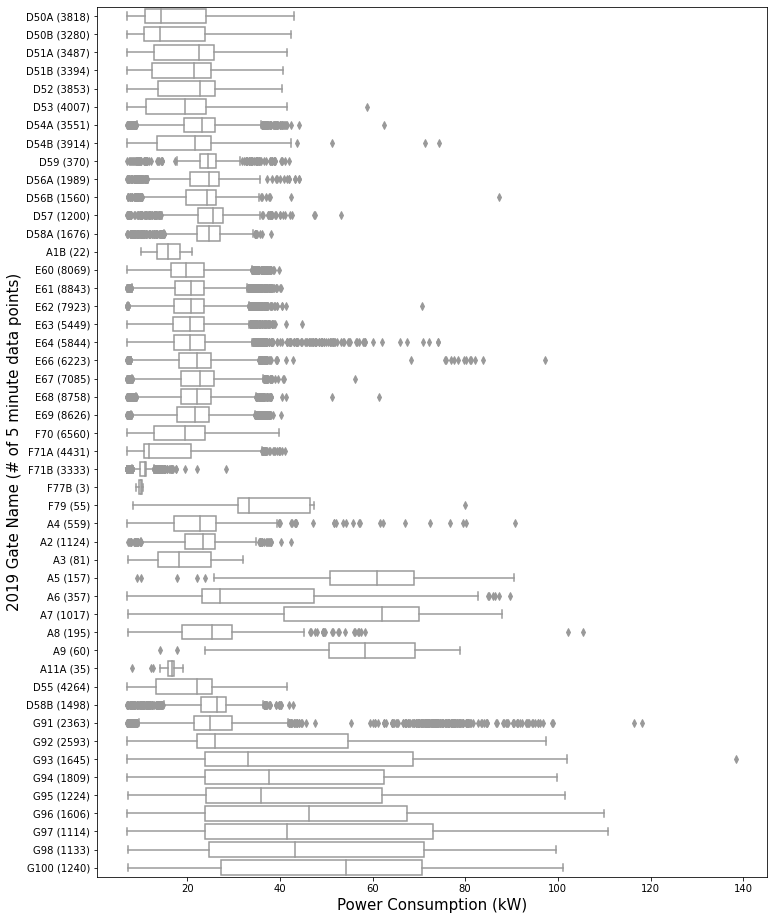

In [141]:
# Consumption by Gate 

#order_list_gates = data_with_gate_in['Gate'].value_counts().index.tolist()
#counts = data_with_gate_in['Gate'].value_counts().tolist()
gatecounts = data_with_gate_in_180['Gate'].value_counts()

tick_names = []
for i in range(len(sorted_gates)):
    s = sorted_gates[i][5:] + " (" + str(gatecounts[sorted_gates[i]]) + ")"
    tick_names.append(s)

plt.figure(figsize=(12,16))
p=sns.boxplot(data_with_gate_in_180['Power_kW'],data_with_gate_in_180['Gate'], order=sorted_gates, color='white');
#plt.tick_params(labelsize=14)
p.set_yticklabels(tick_names);
plt.xlabel('Power Consumption (kW)',fontsize=15)
plt.ylabel('2019 Gate Name (# of 5 minute data points)',fontsize=15)
plt.rcParams["axes.labelweight"] = "normal"

In [144]:
filterval=['Gate']
valueval=['Power_kW']
boxdf=pd.DataFrame()
boxdf['0%']=data_with_gate_in_180.groupby(filterval)[valueval].min()
boxdf['5%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.05)
boxdf['25%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.25)
boxdf['50%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.5)
boxdf['75%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.75)
boxdf['95%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.95)
boxdf['100%']=data_with_gate_in_180.groupby(filterval)[valueval].max()
boxdf['mean']=data_with_gate_in_180.groupby(filterval)[valueval].mean()
boxdf['STD']=data_with_gate_in_180.groupby(filterval)[valueval].std()
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per gate')
boxdf

,0%,5%,25%,50%,75%,95%,100%,mean,STD
Gate,,,,,,,,,
Gate_A11A,8.16,12.456,15.90,16.68,17.22,18.912,19.08,16.217143,2.103001
Gate_A1B,9.96,12.246,13.44,15.84,18.45,20.868,21.00,15.910909,3.154460
Gate_A2,7.20,12.720,19.56,23.40,25.92,32.502,42.36,22.817295,5.452701
Gate_A3,7.32,8.880,13.68,18.24,25.08,29.160,32.04,18.945185,7.016932
Gate_A4,7.08,12.324,17.16,22.68,26.16,39.156,90.84,23.308980,9.926869
Gate_A5,9.24,28.968,50.88,60.96,68.88,80.184,90.60,58.505732,14.833951
Gate_A6,7.08,15.480,23.28,27.00,47.40,74.616,89.64,34.619496,18.895296
Gate_A7,7.32,21.696,40.80,62.04,69.96,75.720,87.84,54.530855,19.259533
Gate_A8,7.20,12.336,18.78,25.32,29.70,52.512,105.36,27.625846,13.727771


In [ ]:
# Consumption Distributions for All Gates

gates = data['Gate'].unique()
gates.sort()
for gate in gates:
    plt.figure()
    sns.distplot(data[(data['Gate'] == gate) & (data['plane_in_ratio'] == 1) & (data['Power_kW'] >= 0)]['Power_kW'], kde=False, bins=30, norm_hist=True, hist=True)
    plt.title('Histogram of Power Consumption at %s for all plugged-in time periods' % gate)
    plt.xlabel('Power (kW)')
    plt.ylabel('Probability')

In [ ]:
# Consumption Distributions for All Airlines
carriers = data['Carrier Group'].unique()
num_rows = data['Carrier Group'].value_counts()
for carrier in carriers:
    if num_rows[carrier] < 1000:
        continue
    plt.figure()
    sns.distplot(data[(data['Carrier Group'] == carrier) & (data['plane_in_ratio'] == 1) & (data['Power_kW'] >= 0)]['Power_kW'], kde=False, bins=30, norm_hist=True, hist=True)
    plt.title('Histogram of Power Consumption for Carrier %s for all plugged-in time periods' % carrier)
    plt.xlabel('Power (kW)')
    plt.ylabel('Probability')

C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 0, 'Aircraft Design Group (# of 5 minute data points)')

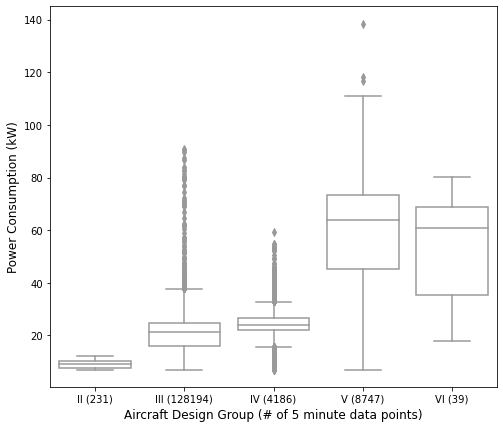

In [84]:
# Box and Whisker Plot of Consumption Power per Airline 
adgorder=['II','III','IV','V','VI']
adgcounts = data_with_gate_in_180['ADG'].value_counts()

tick_names = []
for i in range(len(adgorder)):
    s = adgorder[i] + " (" + str(adgcounts[adgorder[i]]) + ")"
    tick_names.append(s)

data_with_gate_in = data[data['>threshold7'] == True]
plt.figure(figsize=(8,7))
p=sns.boxplot(data_with_gate_in_180['ADG'],data_with_gate_in_180['Power_kW'], color='white',order=['II','III','IV','V','VI']);
#p.set_xticklabels(['II','III','IV','V','VI']);

p.set_xticklabels(tick_names);

plt.ylabel('Power Consumption (kW)',fontsize=12)
plt.xlabel('Aircraft Design Group (# of 5 minute data points)',fontsize=12)

In [80]:
filterval=['ADG']
valueval=['Power_kW']
boxdf=pd.DataFrame()
boxdf['0%']=data_with_gate_in_180.groupby(filterval)[valueval].min()
boxdf['5%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.05)
boxdf['25%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.25)
boxdf['50%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.5)
boxdf['75%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.75)
boxdf['95%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.95)
boxdf['100%']=data_with_gate_in_180.groupby(filterval)[valueval].max()
boxdf['mean']=data_with_gate_in_180.groupby(filterval)[valueval].mean()
boxdf['STD']=data_with_gate_in_180.groupby(filterval)[valueval].std()
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per Aircraft Design Group')

In [82]:
filterval=['Carrier Group']
valueval=['Power_kW']
boxdf=pd.DataFrame()
boxdf['0%']=data_with_gate_in_180.groupby(filterval)[valueval].min()
boxdf['5%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.05)
boxdf['25%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.25)
boxdf['50%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.5)
boxdf['75%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.75)
boxdf['95%']=data_with_gate_in_180.groupby(filterval)[valueval].quantile(0.95)
boxdf['100%']=data_with_gate_in_180.groupby(filterval)[valueval].max()
boxdf['mean']=data_with_gate_in_180.groupby(filterval)[valueval].mean()
boxdf['STD']=data_with_gate_in_180.groupby(filterval)[valueval].std()
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per Airline')

In [88]:
data_with_gate_in_180['Carrier Group'].value_counts()

United Airlines      89478
Alaska Airlines      34588
American Airlines     7262
Air Canada            5619
Signature             1181
Jet Blue               991
Other                  970
Pacific Aviation       857
Frontier Airlines      440
Delta Air Lines         11
Name: Carrier Group, dtype: int64

In [89]:
airlines=['Signature', 'Frontier Airlines', 'Jet Blue', 'Other',
       'Pacific Aviation', 'Delta Air Lines', 'Alaska Airlines',
       'United Airlines', 'American Airlines', 'Air Canada']
airlines.sort()
airlines

['Air Canada',
 'Alaska Airlines',
 'American Airlines',
 'Delta Air Lines',
 'Frontier Airlines',
 'Jet Blue',
 'Other',
 'Pacific Aviation',
 'Signature',
 'United Airlines']

C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0, 'Airline (# of operations)')

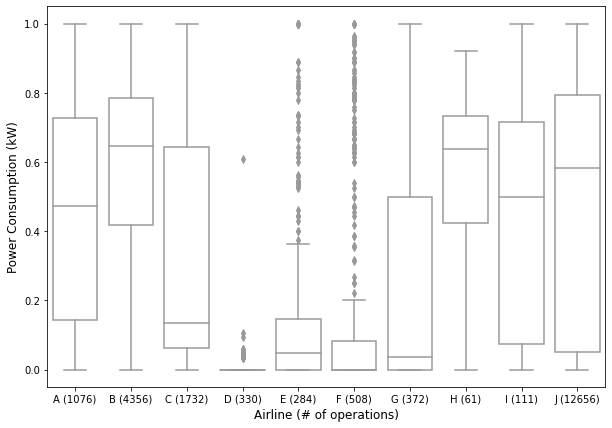

In [155]:
# Box and Whisker Plot of Consumption Power per Airline 
carriercounts = operations_grouped180['Carrier Group'].value_counts()
dumb=['A','B','C','D','E','F','G','H','I','J']
tick_names = []
for i in range(len(airlines)):
    s = dumb[i] + " (" + str(carriercounts[airlines[i]]) + ")"
    tick_names.append(s)
    
plt.figure(figsize=(10,7))
p=sns.boxplot(operations_grouped180['Carrier Group'].sort_values(ascending=True),operations_grouped180['ratio_successful'], color='white');
p.set_xticklabels(tick_names);
plt.ylabel('Power Consumption (kW)',fontsize=12)
plt.xlabel('Airline (# of operations)',fontsize=12)
#plt.title('400Hz Consumption Data by Airline (for all plugged-in time periods)');

In [154]:
operations_grouped180

,Actual Landing Time (Aerobahn),Carrier Group,Cumulative_kWh,Destination Airport,Gate,International or Domestic Indicator,Model,Origination Airport,Power_kW,Real_Timestamp,...,PM (kg)_grandtotal,Fuel (kg)_grandtotal,ACRP_d_FF(kg)_grandtotal,ACRP_EICO2(kg)_grandtotal,ACRP_EICO(kg)_grandtotal,ACRP_EIHC(kg)_grandtotal,ACRP_EINOx(kg)_grandtotal,row_successful,ratio_successful,Source_CSV
op_id,,,,,,,,,,,,,,,,,,,,,
0,2019-04-01 10:48:00,Delta Air Lines,135487.07,GDL,Gate_A1,International,B738,GDL,0.00,2019-04-01 11:00:00,...,0.054767,176.666667,207.720000,655.356600,1.286552,0.112378,1.417590,False,0.000000,sample_data/5c_all_operations_with_all_emissio...
1,2019-04-01 12:57:00,Delta Air Lines,135487.07,MEX,Gate_A1,International,B738,MEX,0.00,2019-04-01 13:10:00,...,0.050633,163.333333,191.880000,605.381400,1.195947,0.105566,1.309086,False,0.000000,sample_data/5c_all_operations_with_all_emissio...
3,2019-04-04 12:42:00,Delta Air Lines,135487.07,MEX,Gate_A1,International,B738,MEX,0.00,2019-04-04 12:55:00,...,0.055800,180.000000,211.680000,667.850400,1.309203,0.114080,1.444716,False,0.000000,sample_data/5c_all_operations_with_all_emissio...
5,2019-04-04 22:07:00,Delta Air Lines,135487.07,MEX,Gate_A1,International,B738,MEX,0.00,2019-04-04 22:15:00,...,0.054250,175.000000,205.740000,649.109700,1.275226,0.111526,1.404027,True,0.045455,sample_data/5c_all_operations_with_all_emissio...
6,2019-04-05 11:02:00,Delta Air Lines,135487.07,GDL,Gate_A1,International,B738,GDL,0.00,2019-04-05 11:20:00,...,0.047533,153.333333,180.000000,567.900000,1.127993,0.100458,1.227708,False,0.000000,sample_data/5c_all_operations_with_all_emissio...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22739,2019-10-10 10:16:00,United Airlines,563023.39,LHR,Gate_G98,International,77X,TLV,0.84,2019-10-10 11:00:00,...,0.026357,84.837447,87.016952,274.538484,0.214111,0.025101,0.912972,False,0.846154,sample_data/5c_all_operations_with_all_emissio...
22740,2019-10-10 16:54:00,United Airlines,563157.45,PVG,Gate_G98,International,78V,ZRH,0.84,2019-10-10 17:20:00,...,0.026114,84.054523,86.233191,272.065718,0.213218,0.024952,0.904359,False,0.842105,sample_data/5c_all_operations_with_all_emissio...
22741,2019-10-11 11:06:00,United Airlines,563570.25,PVG,Gate_G98,International,78Z,ICN,0.84,2019-10-11 11:25:00,...,0.075456,243.139560,245.488373,774.515815,0.394769,0.055211,2.654573,True,0.480000,sample_data/5c_all_operations_with_all_emissio...


C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0, 'Airline (# of 5 minute data points)')

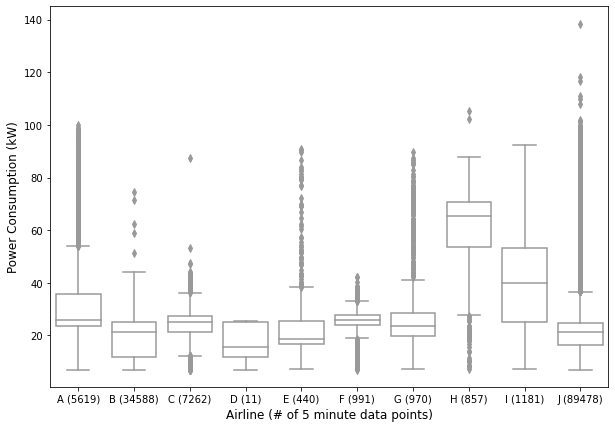

In [151]:
# Box and Whisker Plot of Consumption Power per Airline 
carriercounts = data_with_gate_in_180['Carrier Group'].value_counts()
dumb=['A','B','C','D','E','F','G','H','I','J']
tick_names = []
for i in range(len(airlines)):
    s = dumb[i] + " (" + str(carriercounts[airlines[i]]) + ")"
    tick_names.append(s)
    
plt.figure(figsize=(10,7))
p=sns.boxplot(data_with_gate_in_180['Carrier Group'].sort_values(ascending=True),data_with_gate_in_180['Power_kW'], color='white');
p.set_xticklabels(tick_names);
plt.ylabel('Power Consumption (kW)',fontsize=12)
plt.xlabel('Airline (# of 5 minute data points)',fontsize=12)
#plt.title('400Hz Consumption Data by Airline (for all plugged-in time periods)');

In [ ]:
plt.figure(figsize=(10,7))

y=data_with_gate_in.groupby(['Carrier Group','ADG']).count()
yy=y['Power_kW'].reset_index()
yy['perc'] = yy.groupby('Carrier Group')['Power_kW'].apply(lambda x: x*100/x.sum())

#ytot=data_with_gate_in.groupby(['Carrier Group']).count()
#yytot=ytot['Power_kW'].reset_index()
#print(yy/yytot)
#p=sns.barplot(x='Carrier Group',y='Power_kW',hue='ADG', data=yy);
hue_order = ['II','III','IV','V','VI']
p=sns.barplot(x='Carrier Group',y='perc',hue='ADG', data=yy,hue_order=hue_order,palette=["C4", "C0", "C1", "C2",'C3']);
plt.ylabel('Percentage of each ADG within each Airline',fontsize=15)
plt.xlabel('Airline')
p.set_xticklabels(['A','B','C','D','E','F','G','H','I','J']);
plt.xlabel('Airline',fontsize=15)
plt.legend(bbox_to_anchor=(0.6, 0.96), loc='upper left', borderaxespad=0,title='ADG')


In [ ]:
plt.figure(figsize=(15,12))

y=data_with_gate_in.groupby(['Carrier Group','ADG']).count()
yy=y['Power_kW'].reset_index()
print(i for i in yy['Carrier Group'].index)
#For x in yy['Carrier Group'].index()
#ytot=data_with_gate_in.groupby(['Carrier Group']).count()
#yytot=ytot['Power_kW'].reset_index()
#print(yy/yytot)
#p=sns.barplot(x='Carrier Group',y='Power_kW',hue='ADG', data=yy);
#p=sns.distplot(x='Carrier Group',y='Power_kW',hue='ADG', data=);

# Analysis of Operational Success

In [93]:
# Operation Success Across Dataset

#operations_grouped_no1 = operations_grouped[operations_grouped['ratio_successful'] != 1] #>1 are error
fig =  px.histogram(operations_grouped, x="ratio_successful",histnorm='probability') #,, color='ADG')
avg = np.mean(operations_grouped['ratio_successful'])

# Add figure title

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)')

# Set axes title
#fig.update_xaxes(title_text="Ratio of Operation Success <br><br><b>Average Success Ratio: %.2f</b>" % avg)
fig.update_yaxes(title_text="Probability")
fig.update_xaxes(title_text='GP Utilization')
fig.show()
print()

In [ ]:
import plotly.graph_objs as go
import numpy as np
import pandas as pd

#data = operations_grouped_no1[operations_grouped_no1['ratio_successful']!=0]
data = operations_grouped


x = data['ratio_successful'].values.tolist()
print(np.mean(x))
print(np.std(x))

hist, bin_edges = np.histogram(x, bins=100, density=True)


cdf = np.cumsum(hist * np.diff(bin_edges))*100
bin_edges=bin_edges*100
#cdf_reverse = np.cumsum(np.flip(hist) * np.diff(bin_edges))

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Bar(x=bin_edges, y=hist, name='Probability Density Function'),
    secondary_y=False)
fig.add_trace(
    go.Scatter(x=bin_edges, y=cdf, name='Cumulative Density Function'),
    secondary_y=True,)
#fig.add_trace(
#    p.plot(curvex,curvey, lw=3)
#    go.Scatter(x=bin_edges*100, y=np.flip(cdf_reverse)*100, name='Reverse Cumulative Density Function'),
#    secondary_y=True,)
plt.xlim(0, 1)
plt.ylim(0, 1)

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    legend=dict(
    xanchor="right",x=0.5),
    xaxis=dict(
        title=dict(text="Ground Power Utilization (%)"),
    ),
    yaxis=dict(
        title=dict(text="Probability Density Function (%)"),
        side="left",
        range=[0, 40],
    ),
    yaxis2=dict(
        title=dict(text="Cumulative Density Function (%)"),
        side="right",
        range=[0, 100],
        overlaying="y",
    ),
)

fig.show()

In [ ]:
import plotly.graph_objs as go
import numpy as np
import pandas as pd

#data = operations_grouped_no1[operations_grouped_no1['ratio_successful']!=0]
datano0 = operations_grouped[operations_grouped['ratio_successful']!=0]

x = datano0['ratio_successful'].values.tolist()

print(np.mean(x))
print(np.std(x))

hist, bin_edges = np.histogram(x, bins=99, density=True)
tot=sum(hist)

print(tot)

#from scipy.stats import lognorm

#shape,loc,scale = lognorm.fit(np.flip(hist))

#print(shape, loc, scale)

#pdf = np.flip(lognorm.pdf(bin_edges, shape, loc, scale)*100)
cdf = np.cumsum(hist * np.diff(bin_edges))*100
bin_edges=bin_edges*100
#mean, var, skew, kurt = lognorm.stats(s, moments='mvsk')

#cdf_reverse = np.cumsum(np.flip(hist) * np.diff(bin_edges))

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Bar(x=bin_edges, y=hist*100/tot, name='Probability Density Function'),
    secondary_y=False)

fig.add_trace(
    go.Scatter(x=bin_edges, y=cdf, name='Cumulative Density Function'),
    secondary_y=True)

#fig.add_trace(
#    go.Scatter(x=bin_edges, y=pdf, name='Lognormal Fit'),
#    secondary_y=False)

plt.xlim(0, 1)
plt.ylim(0, 1)

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    legend=dict(
    xanchor="right",x=0.5),
    xaxis=dict(
        title=dict(text="Ground Power Utilization (%)"),
    ),
    yaxis=dict(
        title=dict(text="Probability Density Function (%)"),
        side="left",
        range=[0, 2.5],
    ),
    yaxis2=dict(
        title=dict(text="Cumulative Density Function (%)"),
        side="right",
        range=[0, 100],
        overlaying="y",
    ),
)

fig.show()

In [92]:
##### Operational Success by Airline
carriers = operations_grouped['Carrier Group'].unique()
num_rows = operations_grouped['Carrier Group'].value_counts()
for carrier in carriers:
    this_carrier = operations_grouped[operations_grouped['Carrier Group'] == carrier]
    
    avg = np.mean(this_carrier['ratio_successful'])
    zero = np.mean(this_carrier['ratio_successful']==0)
    decent = np.mean(this_carrier[this_carrier['ratio_successful']>0]['ratio_successful'])
        
    fig =  px.histogram(this_carrier, x="ratio_successful", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airline: <b>%s</b> <br> Distribution of Operation Success (0 is failed, 1 is 100%% 400Hz Utilization)" % (carrier),
        'x':0.5,
        'xanchor': 'center',
        } 
    )

    # Set axes title
    title_text1="Avg,Zero,Decent Ratios: %.2f</b>" % avg
    title_text2=" %.2f</b>" % zero
    title_text3=" %.2f</b>" % decent
    
    fig.update_xaxes(title_text=title_text1+title_text2+title_text3)

    fig.update_yaxes(title_text="Probability")

    fig.show()

In [ ]:
# Operational Success by Airplane Design Group (ADG)

design_categories = data['ADG'].unique()
design_categories.sort()
for category in design_categories:
    this_category = operations_grouped[operations_grouped['ADG'] == category]
    avg = np.mean(this_category['ratio_successful'])
    
    fig =  px.histogram(this_category, x="ratio_successful", histnorm='probability')

    fig.update_layout(
        title={
            'text': "Airplane Design Group (ADG): <b>%s</b> <br> Distribution of Operation Success (0 is failed, 1 is 100%% 400Hz Utilization)" % (category),
            'x':0.5,
            'xanchor': 'center',
        } 
    )

    fig.update_xaxes(title_text="Ratio of Operation Success <br><br><b>Average Success Ratio: %.2f</b>" % avg)
    fig.update_yaxes(title_text="Probability")

    fig.show()

In [102]:
order_list_3 = operations_grouped180['Full_Name '].unique()
len(order_list)

28

In [104]:
order_list_3

array(['Boeing 737-800', 'Boeing 737-700', 'Boeing 737-600',
       'Airbus A321', 'Boeing 787-9', 'Airbus A320', 'Airbus A330-200',
       'Airbus A319', 'Airbus A321neo', 'Airbus A320neo',
       'Airbus A350-900', 'Boeing 777-200ER', 'Airbus A380-800',
       'Boeing 777-200', 'Boeing 747-400', 'Airbus A330-300',
       'Embraer 175', 'Boeing 737-900', 'Boeing 767-300',
       'Boeing 757-200', 'MD-83', 'Boeing 787-8', 'Boeing 757-300',
       'CRJ-700', 'CRJ-200', 'Boeing 777-300ER', 'CRJ-900',
       'Boeing 777-200LR', 'Boeing 787-10'], dtype=object)

C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



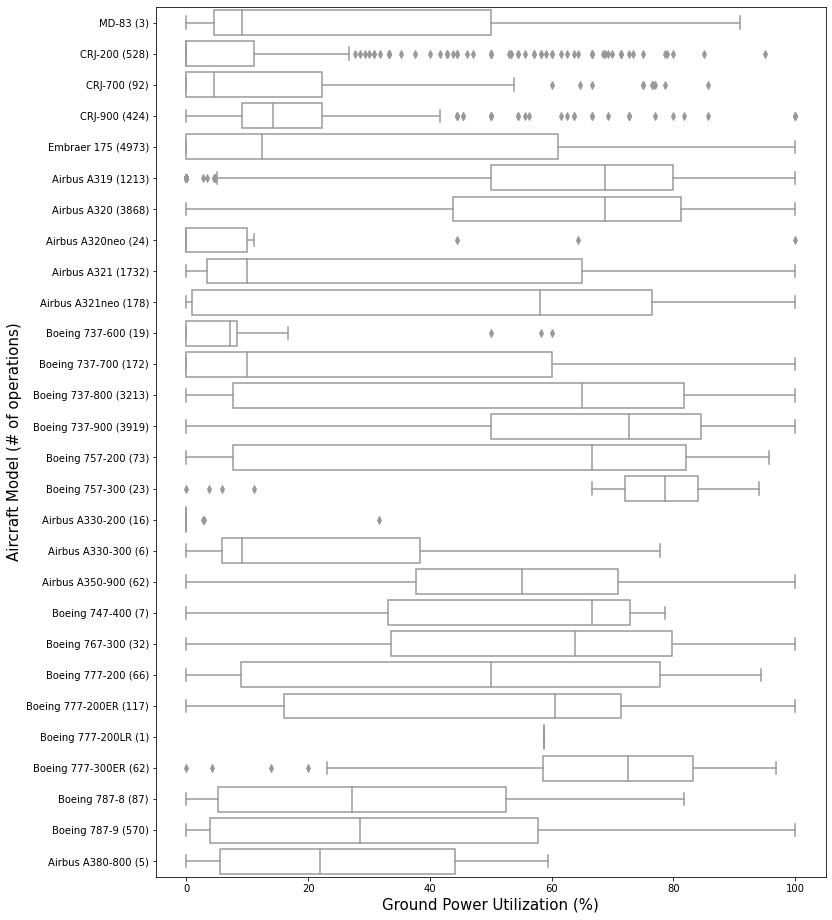

In [118]:
# Operational Success by Aircraft Subtype
# Consumption by Gate 
counts_3 = operations_grouped180['Full_Name '].value_counts()

tick_names_3 = []
for i in range(len(order_list)):
    s = order_list[i] + " (" + str(counts_3[order_list[i]]) + ")"
    tick_names_3.append(s)

plt.figure(figsize=(12,16))
p=sns.boxplot(operations_grouped180['ratio_successful']*100,operations_grouped180['Full_Name '], order=order_list, color='white');
#plt.tick_params(labelsize=12)
p.set_yticklabels(tick_names_3);
plt.xlabel("Ground Power Utilization (%)",fontsize=15)
plt.ylabel('Aircraft Model (# of operations)',fontsize=15)
#plt.title('Operation Success Ratio by Aircraft Subtype (0 is failed, 1 is 100% 400Hz Utilization)');
#plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "normal"

In [109]:
filterval=['Full_Name ']
valueval=['ratio_successful']
boxdf=pd.DataFrame()
boxdf['0%']=operations_grouped180.groupby(filterval)[valueval].min()*100
boxdf['5%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.05)*100
boxdf['25%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.25)*100
boxdf['50%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.5)*100
boxdf['75%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.75)*100
boxdf['95%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.95)*100
boxdf['100%']=operations_grouped180.groupby(filterval)[valueval].max()*100
boxdf['mean']=operations_grouped180.groupby(filterval)[valueval].mean()*100
boxdf['STD']=operations_grouped180.groupby(filterval)[valueval].std()*100
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per Airline')
boxdf

,0%,5%,25%,50%,75%,95%,100%,mean,STD
Full_Name,,,,,,,,,
Airbus A319,0.000000,0.000000,50.000000,68.750000,80.000000,92.421652,100.000000,59.439434,29.124508
Airbus A320,0.000000,0.000000,43.750000,68.750000,81.250000,93.333333,100.000000,58.103419,30.790366
Airbus A320neo,0.000000,0.000000,0.000000,0.000000,10.000000,61.309524,100.000000,11.566379,24.240077
Airbus A321,0.000000,0.000000,3.392659,10.000000,65.000000,90.000000,100.000000,31.412690,33.633255
Airbus A321neo,0.000000,0.000000,0.925926,58.114035,76.470588,90.250000,100.000000,46.575612,34.545751
Airbus A330-200,0.000000,0.000000,0.000000,0.000000,0.000000,10.037594,31.578947,2.325867,7.859409
Airbus A330-300,0.000000,1.250000,5.923913,9.109731,38.380952,70.333333,77.777778,24.832873,31.127706
Airbus A350-900,0.000000,0.156250,37.683824,55.197133,70.967742,83.273810,100.000000,50.070575,27.200927
Airbus A380-800,0.000000,1.111111,5.555556,21.875000,44.117647,56.323529,59.375000,26.184641,25.263413


C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



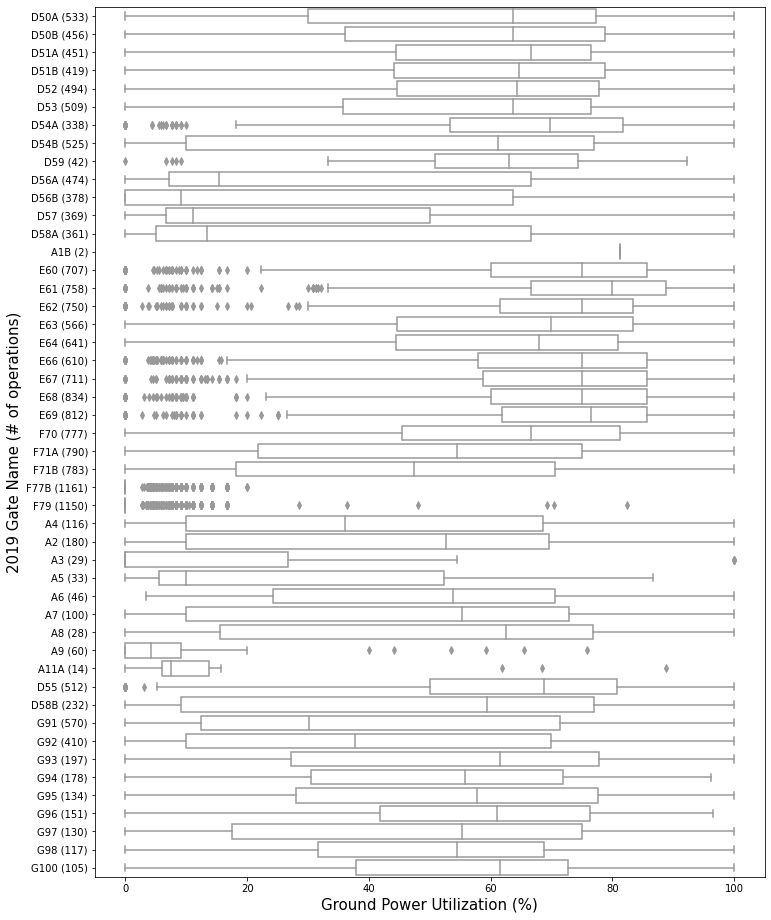

In [120]:
# Operational Success by Gate

#order_list_4 = operations_grouped['Gate'].value_counts().index.tolist()
counts_4 = operations_grouped180['Gate'].value_counts()

tick_names = []
for i in range(len(sorted_gates)):
    s = sorted_gates[i][5:] + " (" + str(counts_4[sorted_gates[i]]) + ")"
    tick_names.append(s)
    

plt.figure(figsize=(12,16))
p=sns.boxplot(100*operations_grouped180['ratio_successful'],operations_grouped180['Gate'],order=sorted_gates, color='white');
#plt.tick_params(labelsize=14)
p.set_yticklabels(tick_names);
plt.xlabel('Ground Power Utilization (%)',fontsize=15)
plt.ylabel('2019 Gate Name (# of operations)',fontsize=15)
#plt.title('Operation Success Ratio Per Gate (0 is failed, 1 is 100% 400Hz Utilization)',fontsize=20);
#plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "normal"

In [145]:
filterval=['Gate']
valueval=['ratio_successful']
boxdf=pd.DataFrame()
boxdf['0%']=operations_grouped.groupby(filterval)[valueval].min()*100
boxdf['5%']=operations_grouped.groupby(filterval)[valueval].quantile(0.05)*100
boxdf['25%']=operations_grouped.groupby(filterval)[valueval].quantile(0.25)*100
boxdf['50%']=operations_grouped.groupby(filterval)[valueval].quantile(0.5)*100
boxdf['75%']=operations_grouped.groupby(filterval)[valueval].quantile(0.75)*100
boxdf['95%']=operations_grouped.groupby(filterval)[valueval].quantile(0.95)*100
boxdf['100%']=operations_grouped.groupby(filterval)[valueval].max()*100
boxdf['mean']=operations_grouped.groupby(filterval)[valueval].mean()*100
boxdf['STD']=operations_grouped.groupby(filterval)[valueval].std()*100
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per Airline')
boxdf

,0%,5%,25%,50%,75%,95%,100%,mean,STD
Gate,,,,,,,,,
Gate_A1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Gate_A10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Gate_A11A,0.000000,0.000000,0.000000,0.000000,9.360466,68.703525,79.634477,15.187077,28.476877
Gate_A12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Gate_A1B,76.427468,76.660149,77.590871,78.754275,79.917678,80.848400,81.081081,78.754275,3.290601
Gate_A2,0.000000,0.000000,0.000000,47.725557,64.202759,87.844943,99.830620,39.893929,32.099782
Gate_A3,0.000000,0.000000,0.000000,0.000000,13.016425,99.082649,100.000000,15.639931,32.309347
Gate_A4,0.000000,0.000000,0.000000,29.801484,62.097379,95.896128,100.000000,33.840807,33.675295
Gate_A5,0.000000,0.000000,0.000000,0.000000,49.724201,71.169785,79.664168,18.974042,28.468275


# APU Time Analysis

In [121]:
# Distribution of APU Time Across Entire Dataset

fig =  px.histogram(operations_grouped180, x="total_time_APU", histnorm='probability') #, color='ADG')

avg = np.mean(operations_grouped180['total_time_APU'])
std = np.std(operations_grouped180['total_time_APU'])

# Add figure title
fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)')


# Set axes title
#fig.update_xaxes(title_text="Total APU Time per Operation <br><br><b>Average Time: %.2fm</b>" % avg)
fig.update_yaxes(title_text="Probability")
fig.update_xaxes(title_text="Total APU Time (min)")

fig.show()
print(avg)
print(std)

42.31403178503747
30.476630990570946


In [122]:
import plotly.graph_objs as go
import numpy as np
import pandas as pd

data = operations_grouped180

data1=data[data['total_time_APU']!=0]
data2=data[data['total_time_APU']<180]

x = data2['total_time_APU'].values.tolist()

avg = np.mean(x)
std = np.std(x)
print(avg)
print(std)

hist, bin_edges = np.histogram(x, bins=180, density=False)


from scipy.stats import lognorm

restored = [[d]*int(hist[n]) for n,d in enumerate((bin_edges[1:]+bin_edges[:-1])/2)]
# flatten the result
restored = [item for sublist in restored for item in sublist]

shape,loc,scale = lognorm.fit(restored,floc=0)

print(shape, loc, scale)

y = lognorm(shape, loc, scale).pdf(bin_edges)
y = y/y.max()
y = y*hist.max()


cdf = np.cumsum(hist * np.diff(bin_edges))
print(max(cdf))


fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Bar(x=bin_edges, y=hist/tot*100, name='Probability Density Function'),
    secondary_y=False)
fig.add_trace(
    go.Scatter(x=bin_edges, y=cdf/222.7769962736514, name='Cumulative Density Function'),
    secondary_y=True,)
fig.add_trace(
    go.Scatter(x=bin_edges, y=y/tot*100, name='LogNormal Fit y=LogNorm(x,s,scale), s=0.7538, scale=33.35'),
    secondary_y=False,)
plt.xlim(0, 1)
plt.ylim(0, 1)

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    legend=dict(
    xanchor="right",x=0.88,
    yanchor="middle",y=0.55),
    xaxis=dict(
        title=dict(text="APU Time (min)"),
    ),
    yaxis=dict(
        title=dict(text="Probability Density Function (%)"),
        side="left",
        range=[0, 2.5],
    ),
    yaxis2=dict(
        title=dict(text="Cumulative Density Function (%)"),
        side="right",
        range=[0, 100],
        overlaying="y",
    ),
)

fig.show()

m,s=lognorm.stats(shape,loc,scale,moments='mv')
print(m)
print(np.sqrt(s))

42.314031785037464
30.476630990570943
0.763380355267169 0.0 32.7399015812297
21366.63333333336


NameError: name 'tot' is not defined

21366.63333333336


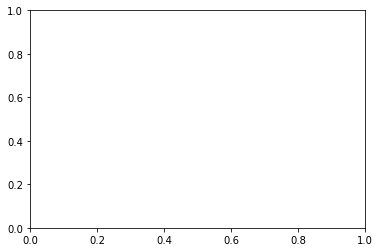

In [123]:
import plotly.graph_objs as go
import numpy as np
import pandas as pd

data = operations_grouped180

x = data['total_time_APU'].values.tolist()

hist, bin_edges = np.histogram(x, bins=180, density=False)

from scipy.stats import lognorm

shape,loc,scale = 0.7538059316930901, 0.0, 33.228981045567195

y = lognorm(shape, loc, scale).pdf(bin_edges)
#y = y/y.max()
#y = y*hist.max()

cdf = np.cumsum(hist * np.diff(bin_edges))
print(max(cdf))


fig = make_subplots(specs=[[{"secondary_y": True}]])
#fig.add_trace(
#    go.Bar(x=bin_edges, y=hist/tot*100, name='Probability Density Function'),
#    secondary_y=False)
#fig.add_trace(
#    go.Scatter(x=bin_edges, y=cdf/215.01, name='Cumulative Density Function'),
#    secondary_y=True,)
fig.add_trace(
    go.Scatter(x=bin_edges, y=y, name='Log-Normal Fit'),
    secondary_y=False,)
plt.xlim(0, 1)
plt.ylim(0, 1)

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    legend=dict(
    xanchor="right",x=0.75,
    yanchor="middle",y=0.7),
    xaxis=dict(
        title=dict(text="APU Time (min)"),
    ),
    yaxis=dict(
        title=dict(text="Probability Density Function (%)"),
        side="left",
        range=[0, 2.5],
    ),
    yaxis2=dict(
        title=dict(text="Cumulative Density Function (%)"),
        side="right",
        range=[0, 100],
        overlaying="y",
    ),
)

fig.show()

In [124]:
good=np.sum(operations_grouped180['total_time_APU']<25.63)
tota=np.sum(operations_grouped180['total_time_APU']>0)
good/tota

0.3604023095548519

In [125]:
# APU Time by Airline
carriers = operations_grouped180['Carrier Group'].unique()
num_rows = operations_grouped180['Carrier Group'].value_counts()

for carrier in carriers:
    #if num_rows[carrier] < 1000:
      #  continue
        
    this_carrier = operations_grouped180[operations_grouped180['Carrier Group'] == carrier]
    avg = np.mean(this_carrier['total_time_APU'])
    
    zero = np.mean(this_carrier[this_carrier['ratio_successful']==0]['total_time_APU'])
    decent = np.mean(this_carrier[this_carrier['ratio_successful']>0]['total_time_APU'])
        
    fig =  px.histogram(this_carrier, x="total_time_APU", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airline: <b>%s</b> <br> Distribution of Total APU Time Per Operation" % (carrier),
        'x':0.5,
        'xanchor': 'center', 
        } 
    )

    # Set axes title
    title_text1="Avg,Zero,Decent Ratios: %.2f</b>" % avg
    title_text2=" %.2f</b>" % zero
    title_text3=" %.2f</b>" % decent
    
    fig.update_xaxes(title_text=title_text1+title_text2+title_text3)
    fig.update_yaxes(title_text="Probability")

    fig.show()

In [126]:
def time_apu_ran(op):
    time_apu_ran = 0
    APU_before_predicted = 0
    for item, row in op.iterrows():
        if row['ratio_400hz'] < 1:
            time_apu_ran += 5 * row['ratio_APU']
            APU_before_predicted = (row['Scheduled Off Block Time (Aerobahn)'] - row['Real_Timestamp']).total_seconds()/60
        else:
            break
    op['APU_before_predicted'] = APU_before_predicted
    op['time_apu_ran'] = time_apu_ran
    return op


In [127]:
carriers = apu_delay['Carrier Group'].unique()
num_rows = apu_delay['Carrier Group'].value_counts()

apu_delay['minutes_delayeds'] = (apu_delay['off_block_time_dt'] - apu_delay['Scheduled Off Block Time (Aerobahn)'])
apu_delay['minutes_delayed']=apu_delay['minutes_delayeds'].dt.total_seconds().round()/60

apu_delay

for carrier in carriers:
    #if num_rows[carrier] < 1000:
      #  continue
        
    this_carrier = apu_delay[apu_delay['Carrier Group'] == carrier]
    avg = np.mean(this_carrier['minutes_delayed'])
    
    zero = np.mean(this_carrier[this_carrier['ratio_successful']==0]['minutes_delayed'])
    decent = np.mean(this_carrier[this_carrier['ratio_successful']>0]['minutes_delayed'])
        
    fig =  px.histogram(this_carrier, x="time_apu_ran", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airline: <b>%s</b> <br> Distribution of  APU before departure Time Per Operation" % (carrier),
        'x':0.5,
        'xanchor': 'center', 
        } 
    )

    # Set axes title
    title_text1="Avg,Zero,Decent Ratios: %.2f</b>" % avg
    title_text2=" %.2f</b>" % zero
    title_text3=" %.2f</b>" % decent
    
    fig.update_xaxes(title_text=title_text1+title_text2+title_text3)
    fig.update_yaxes(title_text="Probability")

    fig.show()

NameError: name 'apu_delay' is not defined

In [ ]:
# APU time by ADG
design_categories = data['ADG'].unique()
design_categories.sort()

for category in design_categories:
    this_category = operations_grouped_no1[operations_grouped_no1['ADG'] == category]
    avg = np.mean(this_category['total_time_APU'])
        
    fig =  px.histogram(this_category, x="total_time_APU", histnorm='probability') #, color='ADG')

    # Add figure title
    fig.update_layout(
        title={
        'text': "Airplane Design Group (ADG): <b>%s</b> <br> Distribution of Total APU Time Per Operation" % (category),
        'x':0.5,
        'xanchor': 'center', 
        } 
    )

    # Set axes title
    fig.update_xaxes(title_text="Total APU Time per Operation <br><br><b>Average Time: %.2fm</b>" % avg)
    fig.update_yaxes(title_text="Probability")

    fig.show()


C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



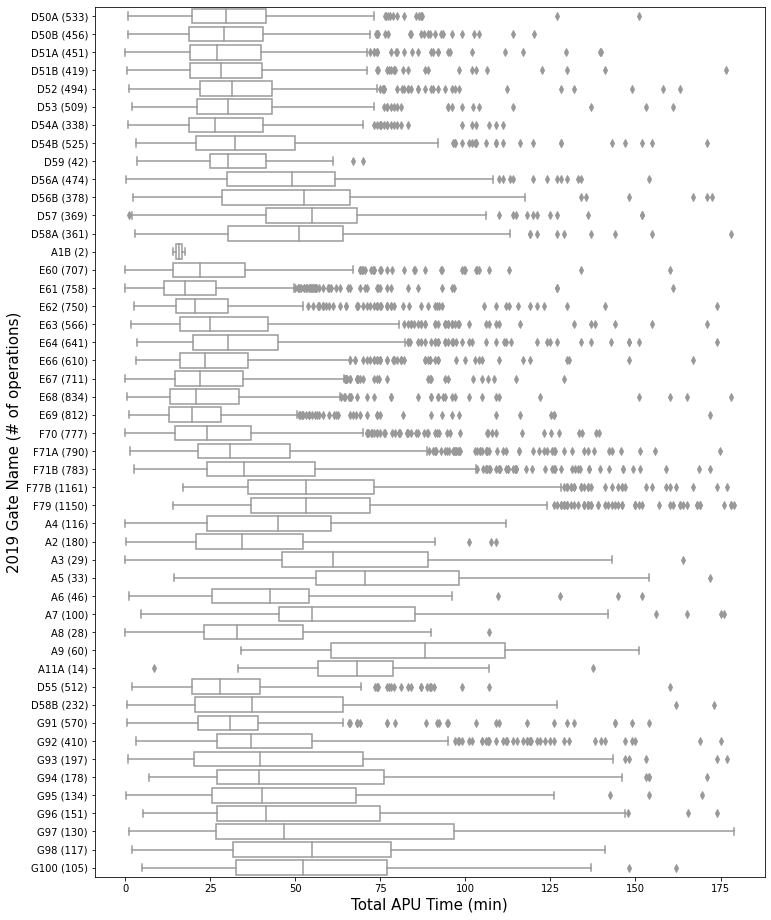

In [135]:
# APU Time by Gate
counts_4 = operations_grouped180['Gate'].value_counts()

tick_names = []
for i in range(len(sorted_gates)):
    s = sorted_gates[i][5:] + " (" + str(counts_4[sorted_gates[i]]) + ")"
    tick_names.append(s)


plt.figure(figsize=(12,16))
p=sns.boxplot(operations_grouped180['total_time_APU'],operations_grouped180['Gate'], order=sorted_gates, color='white');
#plt.tick_params(labelsize=12)
p.set_yticklabels(tick_names);
plt.xlabel('Total APU Time (min)',fontsize=15)
plt.ylabel('2019 Gate Name (# of operations)',fontsize=15)
#plt.title('APU Time by Gate',fontsize=20);
#plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "normal"
#plt.lim(0, 250)

In [149]:
filterval=['Gate']
valueval=['total_time_APU']
boxdf=pd.DataFrame()
boxdf['0%']=operations_grouped180.groupby(filterval)[valueval].min()
boxdf['5%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.05)
boxdf['25%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.25)
boxdf['50%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.5)
boxdf['75%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.75)
boxdf['95%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.95)
boxdf['100%']=operations_grouped180.groupby(filterval)[valueval].max()
boxdf['mean']=operations_grouped180.groupby(filterval)[valueval].mean()
boxdf['STD']=operations_grouped180.groupby(filterval)[valueval].std()
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per Airline')
boxdf

,0%,5%,25%,50%,75%,95%,100%,mean,STD
Gate,,,,,,,,,
Gate_A1,26.000000,63.850000,92.000000,107.000000,122.000000,150.000000,172.000000,107.734637,25.017293
Gate_A10,11.000000,36.350000,57.750000,75.000000,98.000000,135.300000,177.000000,79.753731,31.268305
Gate_A11A,8.349864,24.432455,56.750000,68.000000,78.750000,117.641898,137.405424,67.797232,31.086741
Gate_A12,26.000000,42.000000,58.000000,73.000000,96.000000,136.400000,178.000000,80.016043,29.352526
Gate_A1B,14.000000,14.172184,14.860918,15.721837,16.582755,17.271490,17.443674,15.721837,2.435045
Gate_A2,0.155830,7.974884,20.672719,34.255431,52.250000,76.593413,109.000000,38.573874,22.604817
Gate_A3,0.000000,0.242763,46.000000,61.000000,89.000000,143.000000,164.000000,66.990329,41.713771
Gate_A4,0.000000,6.170624,23.893366,45.000000,60.577797,89.507022,112.000000,45.197416,25.329426
Gate_A5,14.438441,39.419286,56.000000,70.566068,98.000000,143.200000,172.000000,78.800687,34.030386


In [148]:
filterval=['Full_Name ']
valueval=['total_time_APU']
boxdf=pd.DataFrame()
boxdf['0%']=operations_grouped180.groupby(filterval)[valueval].min()
boxdf['5%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.05)
boxdf['25%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.25)
boxdf['50%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.5)
boxdf['75%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.75)
boxdf['95%']=operations_grouped180.groupby(filterval)[valueval].quantile(0.95)
boxdf['100%']=operations_grouped180.groupby(filterval)[valueval].max()
boxdf['mean']=operations_grouped180.groupby(filterval)[valueval].mean()
boxdf['STD']=operations_grouped180.groupby(filterval)[valueval].std()
boxdf.to_excel("converted-to-excel.xlsx",sheet_name='power per Airline')
boxdf

,0%,5%,25%,50%,75%,95%,100%,mean,STD
Full_Name,,,,,,,,,
Airbus A319,1.128309,7.703303,16.262143,24.310412,38.250697,73.000000,174.000000,30.657734,22.462457
Airbus A320,0.000000,7.455077,16.417434,25.391027,41.252480,76.000000,178.000000,31.738500,22.437502
Airbus A320neo,0.000000,32.098454,58.102373,71.500000,83.250000,92.850000,133.000000,68.997378,25.621686
Airbus A321,0.103947,11.436980,30.433282,54.094225,71.000000,111.000000,174.000000,54.922855,30.546415
Airbus A321neo,1.496349,10.744238,22.432075,36.682194,98.000000,127.150000,142.000000,54.605127,40.489716
Airbus A330-200,71.986477,81.746619,121.500000,129.000000,144.250000,177.250000,178.000000,131.936655,30.013951
Airbus A330-300,22.583349,35.476013,79.615503,97.000000,105.500000,116.250000,119.000000,86.289559,34.578884
Airbus A350-900,4.785826,27.186567,48.321639,70.666029,102.931246,153.700000,171.000000,77.237572,39.164857
Airbus A380-800,68.494286,71.795429,85.000000,102.293503,127.926216,163.185243,172.000000,111.142801,40.515224


C:\Users\Msi GS75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(0.0, 180.0)

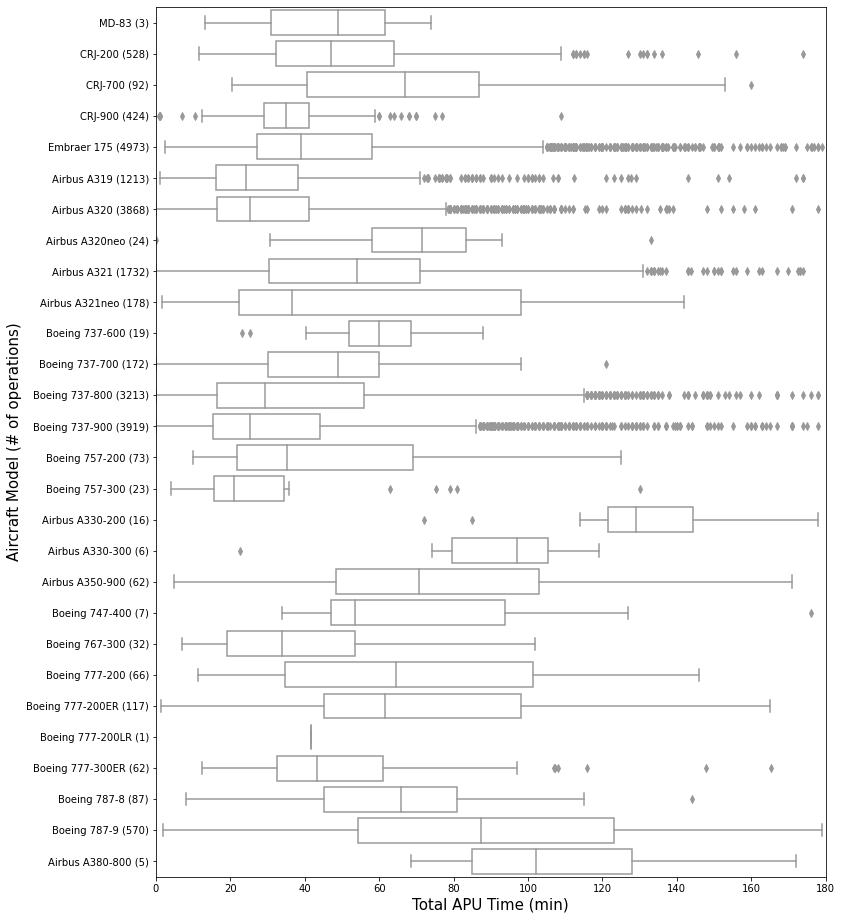

In [137]:
# APU Time by Aircraft Subtype

plt.figure(figsize=(12,16))

counts_3 = operations_grouped180['Full_Name '].value_counts()

tick_names_3 = []
for i in range(len(order_list)):
    s = order_list[i] + " (" + str(counts_3[order_list[i]]) + ")"
    tick_names_3.append(s)
    
p=sns.boxplot(operations_grouped180['total_time_APU'],operations_grouped180['Full_Name '], order=order_list, color='white');
#plt.tick_params(labelsize=12)
p.set_yticklabels(tick_names_3);
plt.xlabel('Total APU Time (min)',fontsize=15)
plt.ylabel('Aircraft Model (# of operations)',fontsize=15)
#plt.title('APU Time by Model',fontsize=20);
#plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "normal"
plt.xlim(0, 180)

# Overall Emissions Analysis

In [ ]:
list(operations_grouped_no1.columns)

In [ ]:
len(operations_grouped180)

In [ ]:
sums['worst_apu_ACRP_EICO2(kg)']

In [ ]:
sums = operations_grouped180.sum() 

print("Displaying emissions data across all operations across entire dataset")
t = PrettyTable(['Power Prediction Totals Across All Data', 'Value'])
t.add_row(['Total Real Energy (KWh)', '%s' % float('%.4g' % sums['Cumulative_kWh'])])
t.add_row(['Total 400Hz Energy Predicted (kWh)', '%s' % float('%.12g' % sums['op_total_400hz'])])
t.add_row(['Total APU Energy Predicted (kWh)', '%s'% float('%.12g' % sums['total_time_APU'])])
t.add_row(['Grand Total Energy Predicted (kWh)', '%s' % float('%.12g' % sums['op_total_pred'])])
print(t)

t = PrettyTable(['Emission Type', 'APU Start Total (kg)', 'APU Normal Total (kg)', 'APU Grand Total (kg)'])
cats = ['NOx', 'NO2', 'CO', 'HC', 'PM', 'Fuel']
for cat in cats:
    normal_total_col = "Normal " + cat + " (kg)_total"
    start_total_col = "Start " + cat + " (kg)_total"
    grand_total_col = cat + " (kg)_grandtotal"
    normal_total = '%s' % float('%.12g' % sums[normal_total_col])
    start_total = '%s' % float('%.12g' % sums[start_total_col])
    grand_total = '%s' % float('%.12g' % sums[grand_total_col])
    t.add_row([cat, start_total, normal_total, grand_total]) 

print(t)

t = PrettyTable(['Emission Type', 'APU No Load Total (kg)', 'APU ECS Total (kg)', 'APU Grand Total (kg)'])

t.add_row(['ACRP Fuel (kg)', sums['ACRP_NoLoad_d_FF(kg)'], sums['ACRP_ECS_d_FF(kg)_total'], sums['ACRP_d_FF(kg)_grandtotal']])
t.add_row(['ACRP EICO2 (kg)', sums['ACRP_NoLoad_EICO2(kg)'], sums['ACRP_ECS_EICO2(kg)_total'], sums['ACRP_EICO2(kg)_grandtotal']])
t.add_row(['ACRP EICO (kg)', sums['ACRP_NoLoad_EICO(kg)'], sums['ACRP_ECS_EICO(kg)_total'], sums['ACRP_EICO(kg)_grandtotal']])                                                                         
t.add_row(['ACRP EIHC (kg)', sums['ACRP_NoLoad_EIHC(kg)'], sums['ACRP_ECS_EIHC(kg)_total'], sums['ACRP_EIHC(kg)_grandtotal']])
t.add_row(['ACRP EINOx (kg)', sums['ACRP_NoLoad_EINOx(kg)'], sums['ACRP_ECS_EINOx(kg)_total'], sums['ACRP_EINOx(kg)_grandtotal']])
print(t)

t = PrettyTable(['Emission Type', 'Worst case (kg)', 'APU Grand Total (kg)', 'Best case (kg)'])
  
t.add_row(['NOx' , sums['worst_apu_NOx (kg)'], sums['NOx (kg)_grandtotal'], sums['best_apu_NOx (kg)']])
t.add_row(['NO2' , sums['worst_apu_NO2 (kg)'], sums['NO2 (kg)_grandtotal'], sums['best_apu_NO2 (kg)']])
t.add_row(['CO' , sums['worst_apu_CO (kg)'], sums['CO (kg)_grandtotal'], sums['best_apu_CO (kg)']])    
t.add_row(['HC' , sums['worst_apu_HC (kg)'], sums['HC (kg)_grandtotal'], sums['best_apu_HC (kg)']])
t.add_row(['PM' , sums['worst_apu_PM (kg)'], sums['PM (kg)_grandtotal'], sums['best_apu_PM (kg)']])
t.add_row(['Fuel' , sums['worst_apu_Fuel (kg)'], sums['Fuel (kg)_grandtotal'], sums['best_apu_Fuel (kg)']])
    
t.add_row(['ACRP_Fuel' , sums['worst_apu_ACRP_Fuel (kg)'], sums['ACRP_d_FF(kg)_grandtotal'], sums['best_apu_ACRP_Fuel (kg)']])
t.add_row(['ACRP EICO2 (kg)' , sums['worst_apu_ACRP_EICO2(kg)'], sums['ACRP_EICO2(kg)_grandtotal'], sums['best_apu_ACRP_EICO2 (kg)']])
t.add_row(['ACRP EICO (kg)' , sums['worst_apu_ACRP_EICO(kg)'], sums['ACRP_EICO(kg)_grandtotal'], sums['best_apu_ACRP_EICO (kg)']])
t.add_row(['ACRP EIHC (kg)' , sums['worst_apu_ACRP_EIHC(kg)'], sums['ACRP_EIHC(kg)_grandtotal'], sums['best_apu_ACRP_EIHC (kg)']])
t.add_row(['ACRP EINOx (kg)' , sums['worst_apu_ACRP_EINOx(kg)'], sums['ACRP_EINOx(kg)_grandtotal'], sums['best_apu_ACRP_EINOx (kg)']])
print(t)

In [ ]:
operations_grouped180['worst_apu_ACRP_EICO2(kg)'].sum()

In [ ]:
print("Exporting to CSV...")    
export_csv = emissions_joined.to_csv(output_5c_location, index = None, header=True)
print("Exporting complete!")    

In [ ]:
output_6a_location = 'sample_data/6adata180.csv'
output_6b_location = 'sample_data/6boperations_grouped180.csv'
output_6c_location = 'sample_data/6cSums.csv'
print("Exporting to CSV...")    
export_csv = data180.to_csv(output_6a_location, index = None, header=True)
print("Exporting complete!")
print("Exporting to CSV...")    
export_csv = operations_grouped180.to_csv(output_6b_location, index = None, header=True)
print("Exporting complete!")    
print("Exporting to CSV...")    
export_csv = sums.to_csv(output_6c_location, index = None, header=True)
print("Exporting complete!")    

In [ ]:
len(operations_grouped180)

In [ ]:
len(data180)